# **Importaciones**

In [1]:
!pip install mapclassify
!pip install geopandas
!pip install factor_analyzer
!pip install plotnine

In [2]:
import pandas as pd
import numpy as np
from tabulate import tabulate
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import plotnine
from plotnine import *
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, scale
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy import stats

import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10


In [3]:
df = pd.read_csv('01_normaliza_minmax.csv')

# **Agregación por Media Generalizada**

* **Media Generalizada**


https://mathworld.wolfram.com/PowerMean.html

https://en.wikipedia.org/wiki/Generalized_mean

La media generalizada es una generalización de la media aritmética que incluye un parámetro β que controla la compensabilidad entre los componentes. La fórmula para la media generalizada de un conjunto de valores x1,​ x2,...,xn con parámetro β es:

Mᵦ (x1, x2, …, xₙ) =

\begin{cases}
\left( \frac{1}{n} \sum_{i=1}^{n} x_i^\beta \right)^{\frac{1}{\beta}} & \text{si } \beta \neq 0 \\
\left( \prod_{i=1}^{n} x_i \right)^{\frac{1}{n}} & \text{si } \beta = 0
\end{cases} 



Donde:

* 𝑛 es el número de componentes (indicadores).
* 𝑥ᵢ son los componentes individuales.
* Cuando 𝛽 = 0, la media generalizada se convierte en la media geométrica.



Con la normalización, es posible que algunas variables de ciertos paises tengan valores que se normalizan a 0. Esto es problematico ya que la media generalizada con beta = 0 se basa en la media geomética.

Solución: Agregar un Pequeño Valor Constante a todas las observaciones antes de aplicar la media. Esto asegura que ningún valor sea cero, evitando así problemas en el cálculo.

# **Funciones**

In [4]:
# Definir la función generalized_mean
def generalized_mean(components, beta):
    EPSILON = 1e-8  # Pequeño valor constante
    if beta != 0:
        return np.power(np.mean(np.power(components + EPSILON, beta)), 1 / beta)
    else:
        return np.power(np.prod(components + EPSILON), 1 / len(components))

# Definir la función de normalización Min-Max
def min_max_normalize(series):
    return ((series - series.min()) / (series.max() - series.min())) * 100

# Calcular el intervalo de confianza al 95% para cada columna
def calcular_intervalo_confianza(data):
    mean = np.mean(data)
    std_error = np.std(data, ddof=1) / np.sqrt(len(data))
    margin_of_error = 1.96 * std_error  # 1.96 es el valor crítico para un intervalo de confianza del 95%
    return mean, mean - margin_of_error, mean + margin_of_error

In [5]:
# Función para realizar bootstrap: sensibilidad e incertidumbre
def bootstrap_analysis(X, beta, n_bootstrap=1000):
    n_rows = X.shape[0]

    # Función para calcular el índice compuesto de una muestra
    def compute_index(sample):
        return generalized_mean(sample, beta)

    # Lista para almacenar resultados de bootstrap
    bootstrap_results = []

    for _ in range(n_bootstrap):
        # Muestreo con reemplazo
        sample_indices = np.random.choice(X.index, size=n_rows, replace=True)
        sample = X.loc[sample_indices]
        # Asegurarse de que los valores están en el rango [0, 100]
        sample = np.clip(sample, 0, 100)
        # Calcular índice compuesto para la muestra
        index_values = sample.apply(lambda row: compute_index(row.values), axis=1)
        bootstrap_results.extend(index_values)

    # Convertir resultados bootstrap a una Serie
    bootstrap_series = pd.Series(bootstrap_results)

    # Calcular varianza
    variance = bootstrap_series.var()

    # Calcular intervalo de confianza
    mean, lower_bound, upper_bound = calcular_intervalo_confianza(bootstrap_series)

    # Crear DataFrame con los resultados de bootstrap
    bootstrap_df = pd.DataFrame({
        'Bootstrap Index': bootstrap_series
    })

    # Crear DataFrame con las cifras de varianza y intervalo de confianza
    results = pd.DataFrame({
        'Variance': [variance],
        'Confidence Interval Mean': [mean],
        'Confidence Interval Lower': [lower_bound],
        'Confidence Interval Upper': [upper_bound]
    })

    return bootstrap_df, results

In [6]:
# Visualización barras
def plot_bar_chart(df, variables, id_var='country', hue_var='variable', palette="Set2", errorbar='ci'):
    """
    Genera un gráfico de barras con las variables especificadas.

    Parameters:
    df (pd.DataFrame): DataFrame que contiene los datos.
    variables (list): Lista de columnas a utilizar como variables.
    id_var (str): Columna que identifica las categorías (por defecto 'country').
    hue_var (str): Nombre de la variable de agrupación (por defecto 'variable').
    palette (str): Paleta de colores a utilizar (por defecto 'Set2').
    errorbar (str): Tipo de barra de error a mostrar (por defecto 'ci').

    Returns:
    None
    """
    sns.set(style="whitegrid")

    # Configurar el tamaño del gráfico
    plt.figure(figsize=(12, 8))

    # Crear el gráfico de barras
    melted_df = pd.melt(df, id_vars=[id_var], value_vars=variables)
    sns.barplot(x=id_var, y='value', hue=hue_var, data=melted_df, palette=palette, errorbar=errorbar)

    # Añadir título y etiquetas
    plt.xlabel(id_var.capitalize())
    plt.ylabel('Value')
    plt.title('Bar Chart')

    # Rotar las etiquetas del eje x para mejor visualización
    plt.xticks(rotation=90)

    # Ajustar el diseño para evitar solapamiento
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()


# Boxplot
def plot_box_chart(df, variables, id_var='country', hue_var='variable', palette="Set2"):
    """
    Genera un gráfico de caja con las variables especificadas.

    Parameters:
    df (pd.DataFrame): DataFrame que contiene los datos.
    variables (list): Lista de columnas a utilizar como variables.
    id_var (str): Columna que identifica las categorías (por defecto 'country').
    hue_var (str): Nombre de la variable de agrupación (por defecto 'variable').
    palette (str): Paleta de colores a utilizar (por defecto 'Set2').

    Returns:
    None
    """
    sns.set(style="whitegrid")

    # Configurar el tamaño del gráfico
    plt.figure(figsize=(12, 8))

    # Crear el gráfico de caja
    melted_df = pd.melt(df, id_vars=[id_var], value_vars=variables)
    sns.boxplot(x=id_var, y='value', hue=hue_var, data=melted_df, palette=palette)

    # Añadir título y etiquetas
    plt.xlabel(id_var.capitalize())
    plt.ylabel('Value')
    plt.title('Box Plot')

    # Rotar las etiquetas del eje x para mejor visualización
    plt.xticks(rotation=90)

    # Ajustar el diseño para evitar solapamiento
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

# Mapas
def plot_maps(df, variables, region_var='region', exclude_regions=None, color='lightgrey', scheme='natural_breaks', k=8, cmap='BrBG'):
    """
    Genera subplots de mapas para las variables especificadas.

    Parameters:
    df (gpd.GeoDataFrame): GeoDataFrame que contiene los datos.
    variables (list): Lista de columnas a utilizar como variables.
    region_var (str): Columna que identifica las regiones (por defecto 'region').
    exclude_regions (list): Lista de regiones a excluir del análisis (por defecto None).
    color (str): Color de fondo de la figura (por defecto 'lightgrey').
    scheme (str): Esquema de clasificación de colores (por defecto 'natural_breaks').
    k (int): Número de intervalos para la clasificación (por defecto 8).
    cmap (str): Paleta de colores a utilizar (por defecto 'BrBG').

    Returns:
    None
    """
    if exclude_regions is not None:
        df = df[~df[region_var].isin(exclude_regions)]

    # Crear la figura y los ejes (subplots)
    fig, axes = plt.subplots(1, len(variables), figsize=(18, 6))  # Ajustar el número de columnas según las variables

    # Si solo hay un gráfico, hacer que 'axes' sea una lista
    if len(variables) == 1:
        axes = [axes]

    # Configurar el color de fondo de la figura
    fig.patch.set_facecolor(color)

    # Iterar sobre cada eje y crear el gráfico correspondiente
    for i, var in enumerate(variables):
        ax = axes[i]
        df.plot(column=var,
                scheme=scheme,
                k=k, cmap=cmap,
                edgecolor='w',
                legend=True,
                ax=ax,
                legend_kwds={'loc': 'upper left', 'fontsize': 8, 'title': var}
                )
        ax.set_title(var)  # Título de cada subplot
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

## **Componentes**

* Crear un data frame para almacenar los indices creados al nivel de componentes

In [7]:
componentes_df = df[['country', 'nuts_code', 'region']]
componentes_df.set_index('nuts_code', inplace=True)

* Añadir datos geograficos para representar en mapas

In [8]:
# Cargar los shapefiles de las regiones NUTS
shapefile_path = 'NUTS_RG_20M_2021_3035.shp'
gdf = gpd.read_file(shapefile_path)


In [9]:
componentes_gdf=pd.merge(gdf[['NUTS_ID','geometry']], componentes_df, how='right', left_on='NUTS_ID', right_on='nuts_code')
componentes_gdf = componentes_gdf.rename(columns={'NUTS_ID': 'nuts_code'})

In [10]:
overseas = ['Guyane', 'Guadeloupe', 'Martinique', 'La Réunion', 'Mayotte', "Região Autónoma dos Açores", 'Região Autónoma da Madeira', 'Canarias']

* Agrupar los indicadores en componentes, según la estructura de la Comisión Europea

In [11]:
nutrition_medical_care = ['infant_mortality']

water_sanitation = ['satisfaction_water_quality',
                    'uncollected_sewage',
                    'sewage_treatment'
                    ]

safety = ['safety_at_night',
          'money_stolen',
          'assaulted',
          'traffic_deaths']

basic_education = ['low_achieving_reading_level',
                   'low_achieving_maths_science',
                   'lower_secondary_only',
                   'early_school_leavers']

information_communications = ['broadband_at_home',
                              'digital_skills_above_basic',
                              'online_interaction_public_authorities',
                              'internet_access',
                              'freedom_media']

health = ['subjective_health_status',
          'cancer_death',
          'heart_death',
          'years_life_lost_pollution',
          'positive_emotions']

enviromental_quality = ['pollution_no2',
                        'pollution_somo35',
                        'pollution_pm25',
                        'bathing_water_quality']

trust_governance = ['trust_national_government',
                    'trust_legal_system',
                    'trust_police',
                    'voiced_opinion',
                    'female_participation',
                    'institution_quality']

freedom_choice = ['freedom_life_choices',
                  'job_opp',
                  'teenage_pregnancy',
                  'young_people_neet',
                  'institutions_corruption']

inclusive_society = ['institution_impartiality',
                     'tt_immigrants',
                     'tt_minorities',
                     'tt_lgtb',
                     'women_respect']

advanced_education = ['tertiary_education',
                      'lifelong_learning',
                      'academic_citations']


### **Nutrition and medical care**

El dataset solo tiene un indicador "infant_mortality", que supondrá nuestro primer indice a nivel componentes

In [12]:
data = {
    'nuts_code': df['nuts_code'],
    'nutrition_medical_care': df['infant_mortality']
}

nmc = pd.DataFrame(data)


nmc.set_index('nuts_code', inplace=True)

componentes_gdf = pd.merge(componentes_gdf, nmc, on='nuts_code')


**[Figura 02.1]**

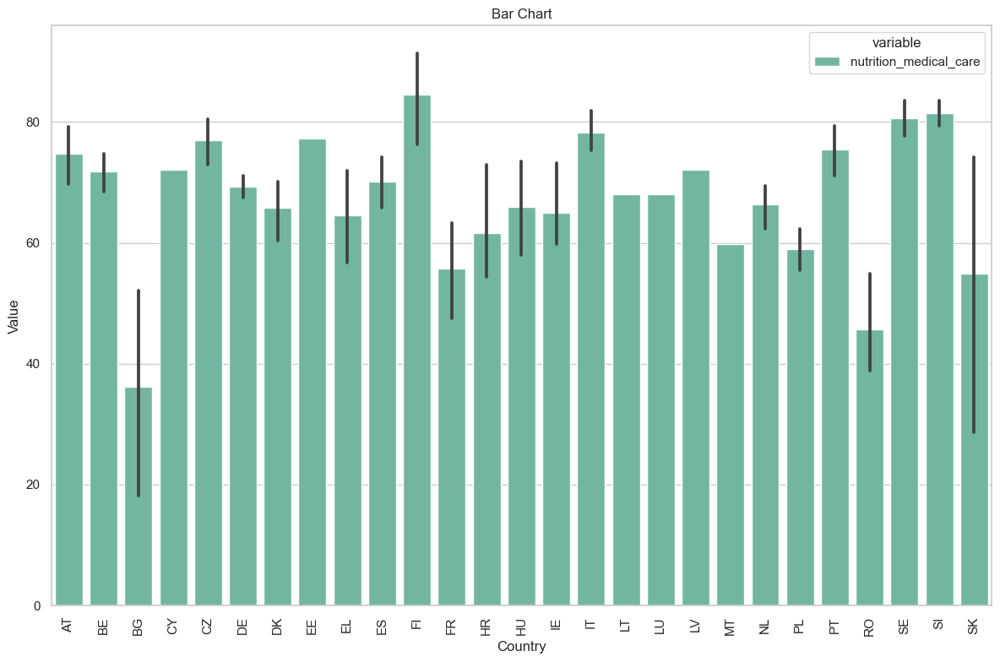

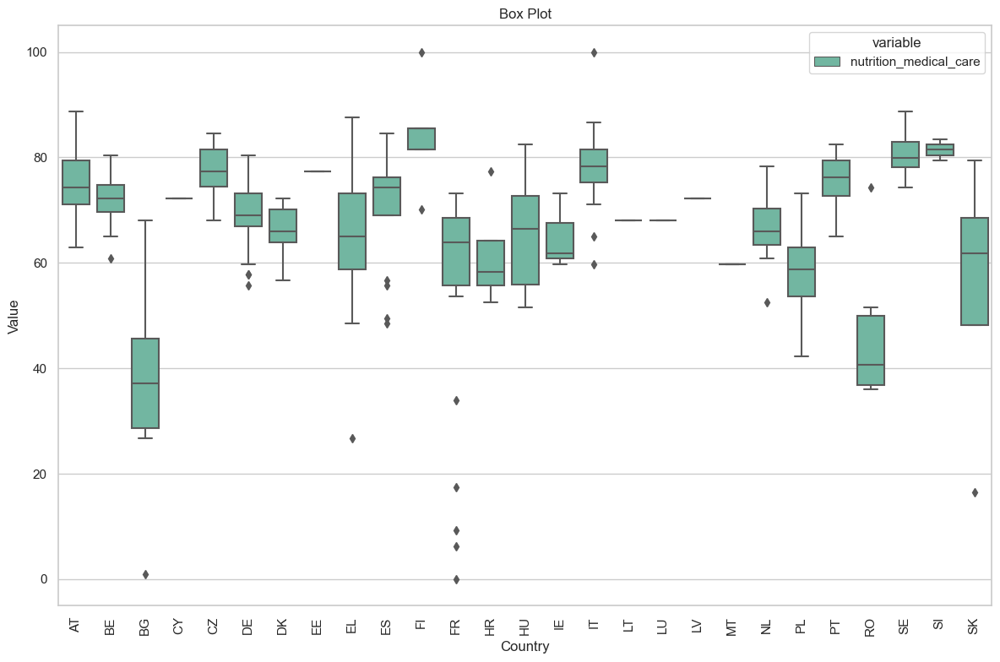

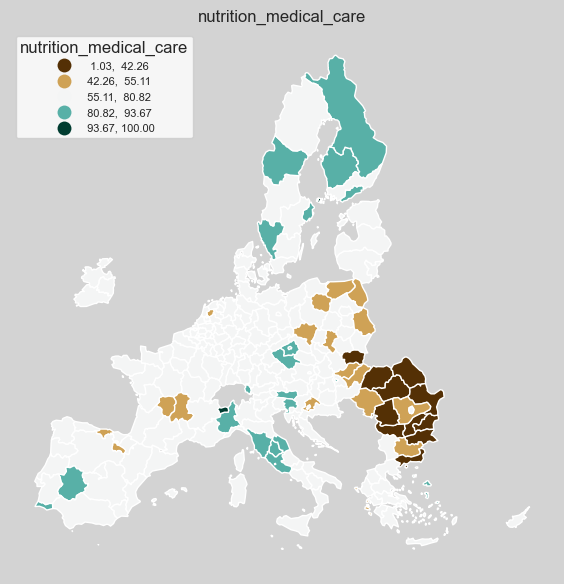

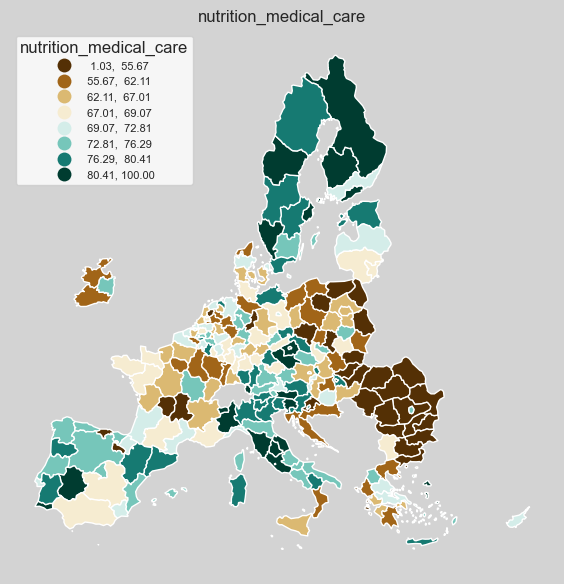

In [13]:
variables = ['nutrition_medical_care']
plot_bar_chart(componentes_gdf, variables)
plot_box_chart(componentes_gdf, variables)
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')

'boxplot', 'equalinterval', 'fisherjenks', 'fisherjenkssampled', 'headtailbreaks', 'jenkscaspall', 'jenkscaspallforced', 'jenkscaspallsampled', 'maxp', 'maximumbreaks', 'naturalbreaks', 'quantiles', 'percentiles', 'prettybreaks', 'stdmean', 'userdefined'

### **Water sanitation**

In [14]:
# Water sanitation
data = {
    'nuts_code': df['nuts_code'],
}


for var in water_sanitation:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)

**[Figura 02.2]**

In [15]:
print("Figura 02.2")
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]


print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())



Figura 02.2

Listado de indicadores y sus cargas absolutas:
|                            |      PC1 |       PC2 |      PC3 |
|:---------------------------|---------:|----------:|---------:|
| satisfaction_water_quality | 0.309893 | 0.934082  | 0.177362 |
| sewage_treatment           | 0.892754 | 0.350042  | 0.283656 |
| uncollected_sewage         | 0.327043 | 0.0704379 | 0.942381 |

Indicadores no consistentes en PC1:
['satisfaction_water_quality', 'uncollected_sewage']


In [16]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [17]:
# Agregación
beta = 1


X['water_sanitation'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

In [18]:
# Añadir indice a componentes

subset = X['water_sanitation']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')

**[Figura 02.3]**

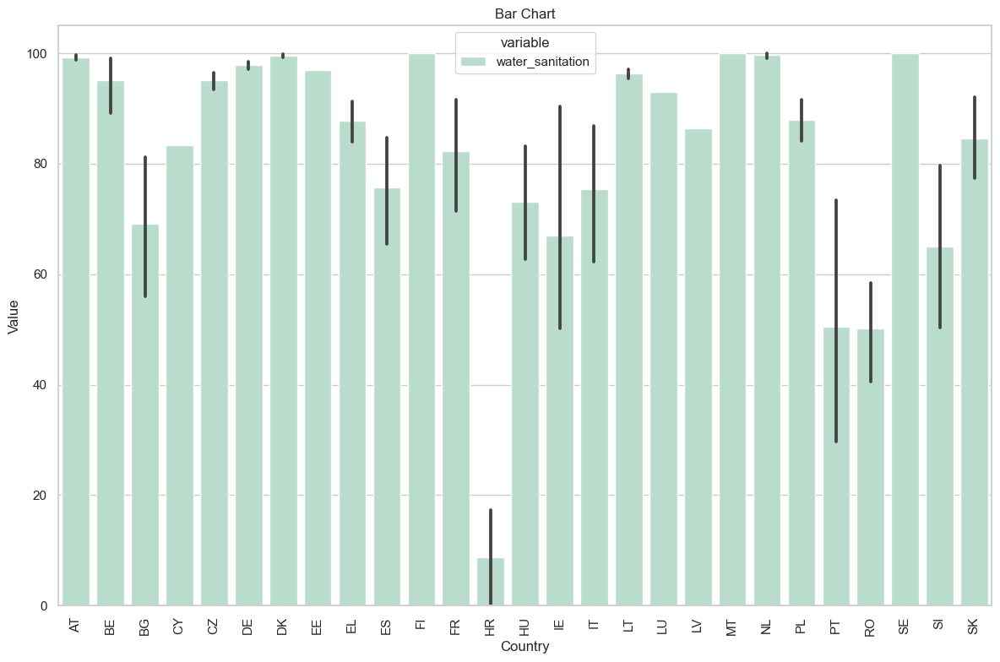

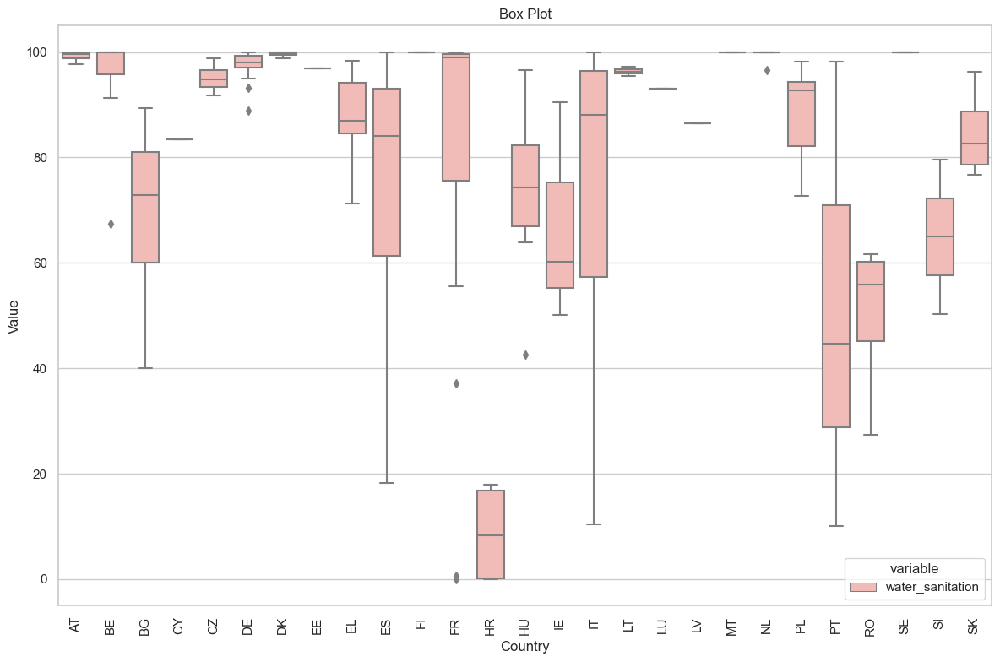

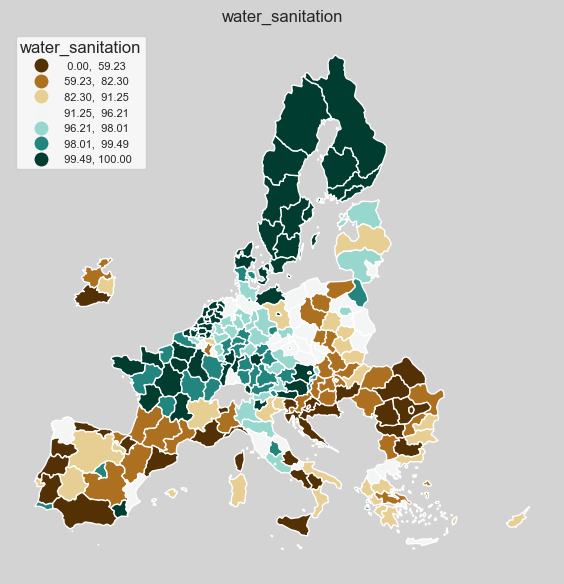

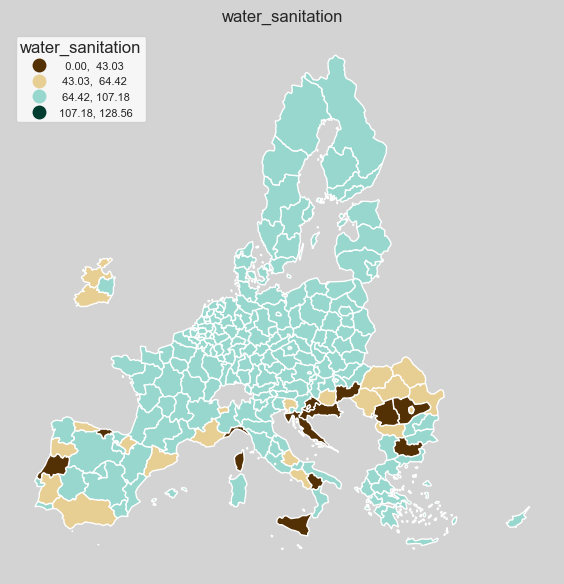

In [19]:
variables = ['water_sanitation']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Análisis de sensibilidad**

*Añadir/Eliminar indicadores*

In [20]:
data = {
    'nuts_code': df['nuts_code'],
}


for var in water_sanitation:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in water_sanitation:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)


**[Figura 02.4]**

Figura 02.4


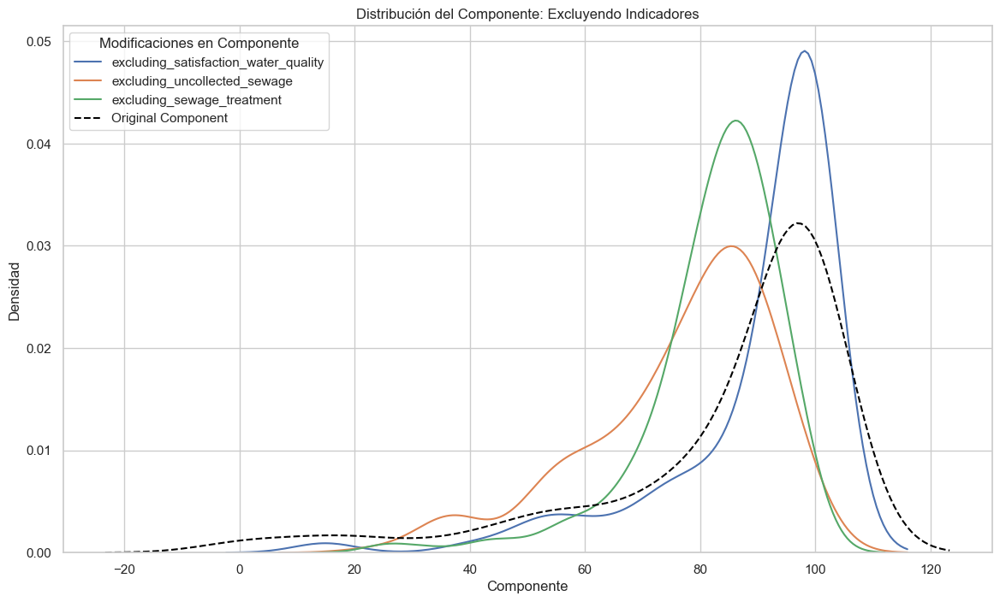

In [21]:
print("Figura 02.4")

# Graficar las distribuciones de los índices al excluir indicadores
plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['water_sanitation'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

Generación de Muestras Bootstrap:

Genera una gran cantidad de muestras mediante el remuestreo con reemplazo de la muestra original. Cada muestra bootstrap tiene el mismo tamaño n que la muestra original.

Intervalo de confianza al 95% para la media se calcula utilizando las medias de las muestras bootstrap. Este intervalo de confianza te dice que, basado en los datos y el remuestreo realizado, puedes estar un 95% seguro de que la verdadera media de la población está detro de este intervalo

**[Figura 02.5]**

Figura 02.5

Cifras de varianza e intervalo de confianza (bootstrap):
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 540.0336238330169 |    84.35385936909908     |     84.26127049802506     |     84.44644824017311     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
544.6672967825118

Intervalo de Confianza al 95%:
(84.30477392006001, 81.36432229952176, 87.24522554059827)


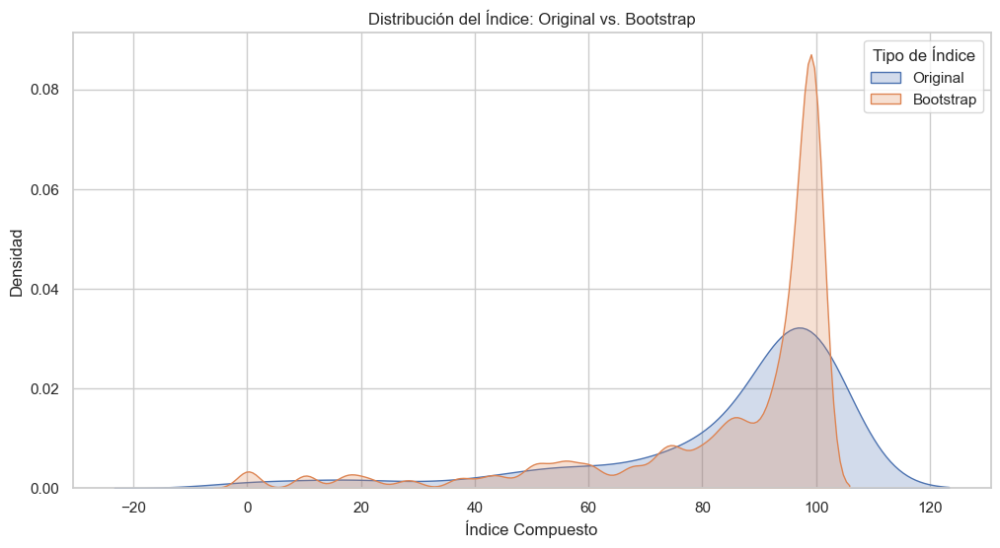

In [22]:
print("Figura 02.5")
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Cifras de varianza e intervalo de confianza (bootstrap):")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Datos originales:")
print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['water_sanitation', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='water_sanitation', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()


### **Safety**

In [23]:
# Safety
data = {
    'nuts_code': df['nuts_code'],
}


for var in safety:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.6]**

In [24]:
print('Figura 02.6')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.6

Listado de indicadores y sus cargas absolutas:
|                 |       PC1 |       PC2 |       PC3 |       PC4 |
|:----------------|----------:|----------:|----------:|----------:|
| assaulted       | 0.805353  | 0.0884389 | 0.586003  | 0.013641  |
| money_stolen    | 0.587434  | 0.0116827 | 0.806955  | 0.0600706 |
| safety_at_night | 0.0777543 | 0.913527  | 0.0402567 | 0.397242  |
| traffic_deaths  | 0.0168035 | 0.396875  | 0.0616749 | 0.915644  |

Indicadores no consistentes en PC1:
['safety_at_night', 'traffic_deaths']


In [25]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [26]:
# Agregación
beta = 1

X['safety'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['safety']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


**[Figura 02.7]**

Figura 02.7


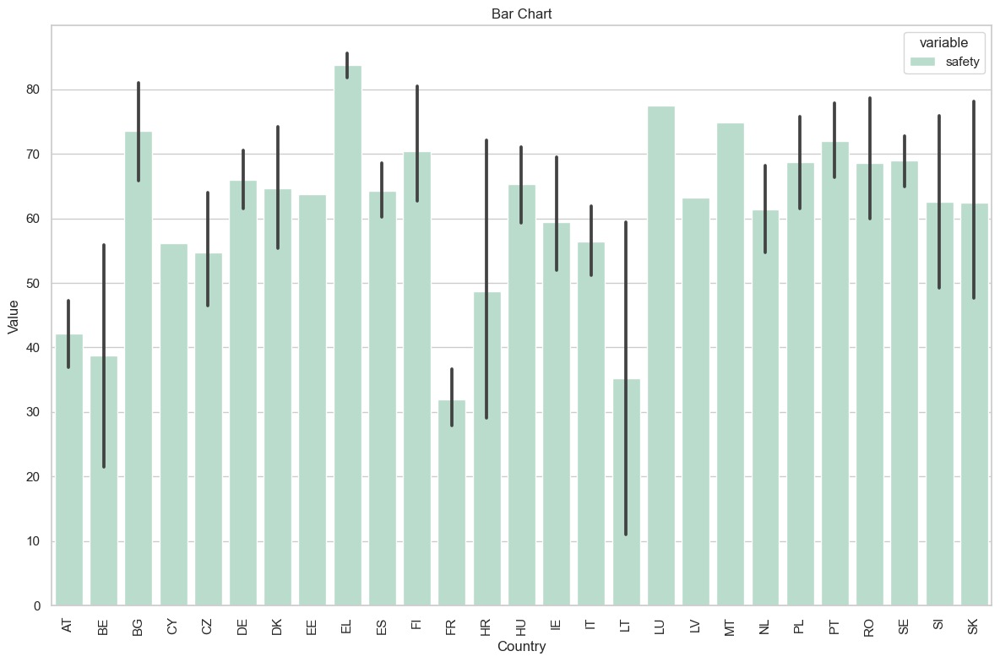

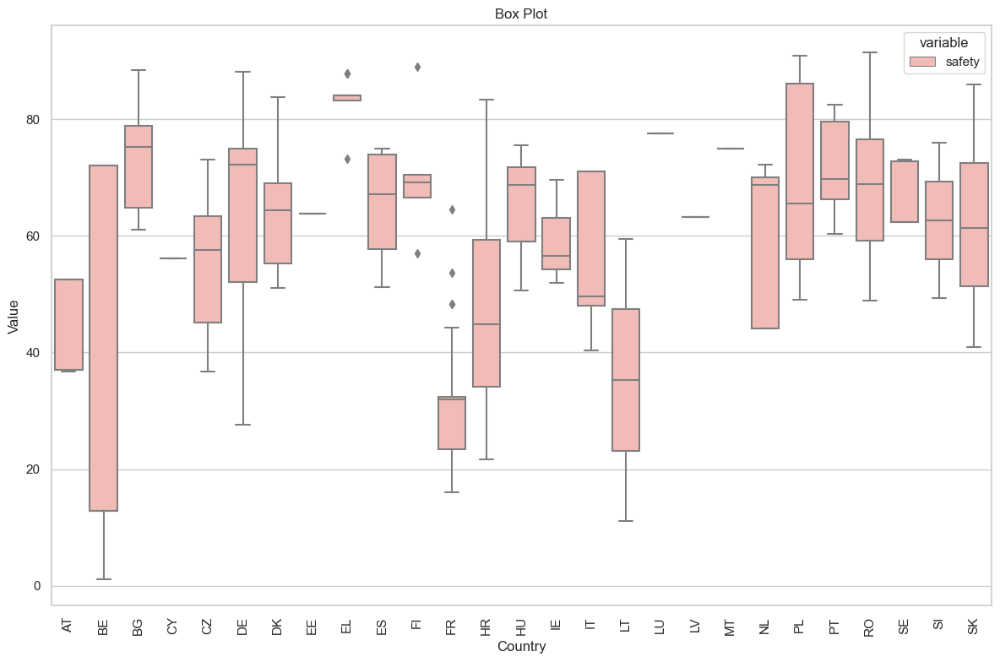

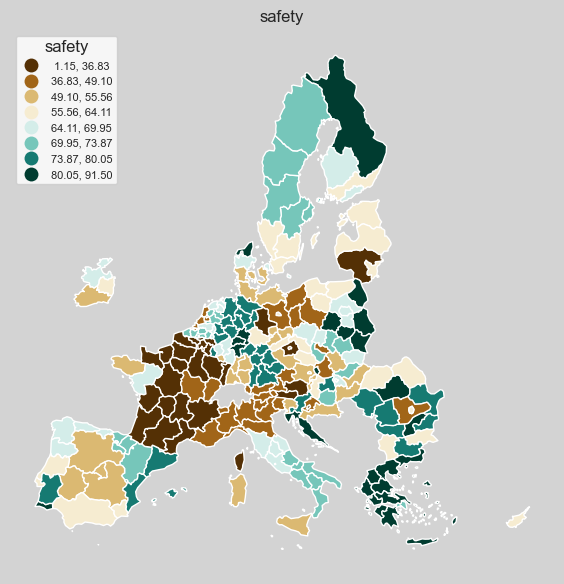

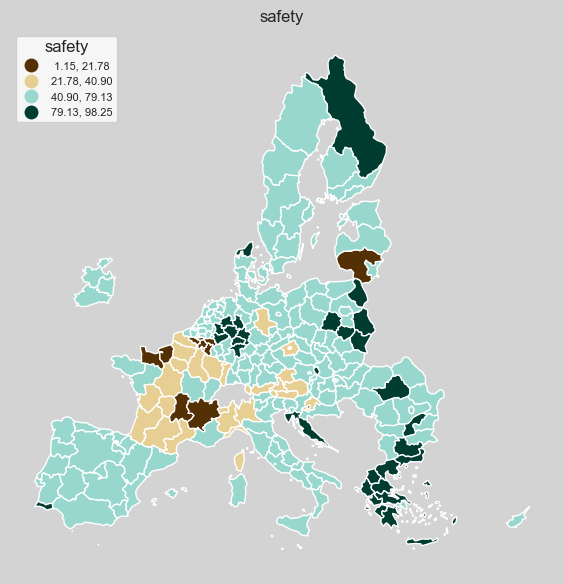

In [27]:
print('Figura 02.7')

variables = ['safety']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.8]** *Análisis de distintos betas*

Figura 02.8



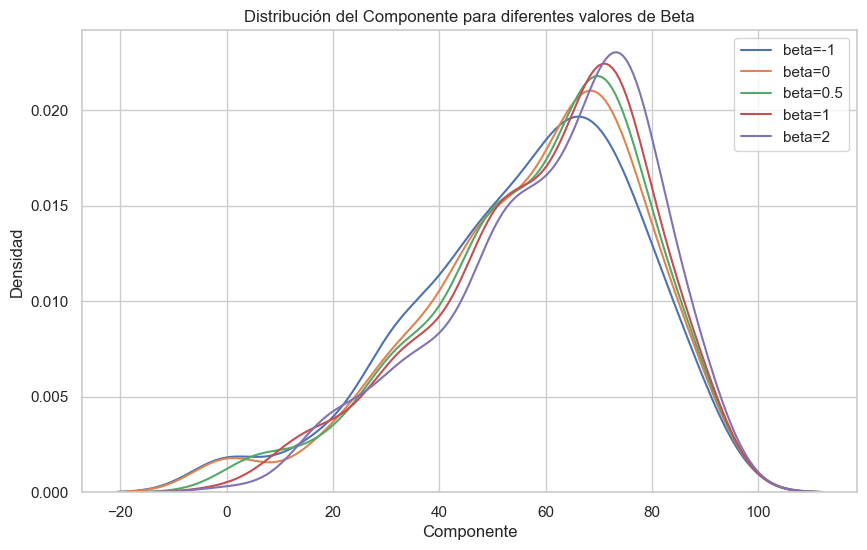

In [28]:
print('Figura 02.8')
print()

data = {
    'nuts_code': df['nuts_code'],
}


for var in safety:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'safety{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'safety{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.9]** *Añadir/Eliminar indicadores*

Figura 02.9


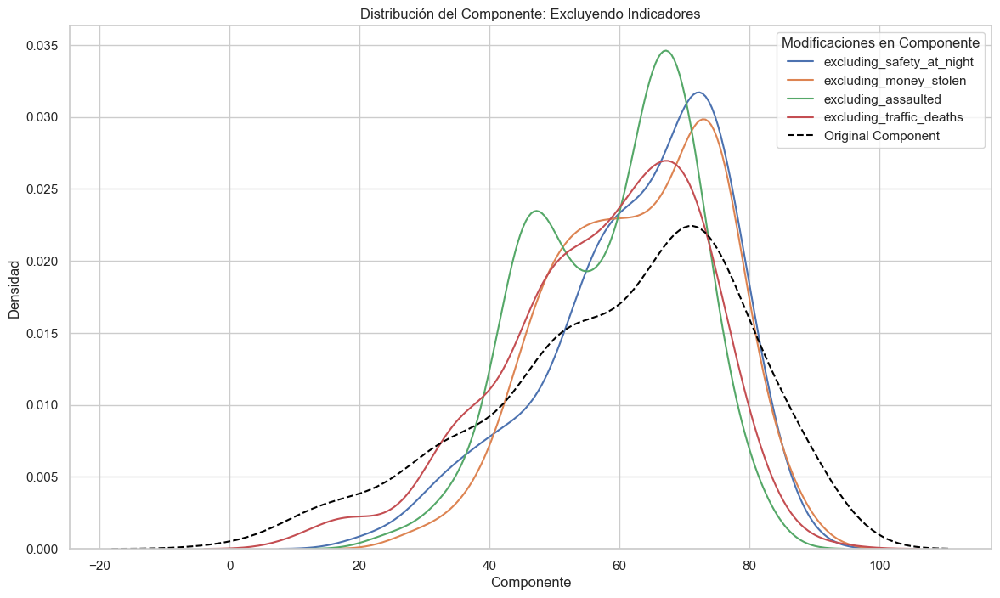

In [29]:
print('Figura 02.9')

data = {
    'nuts_code': df['nuts_code'],
}


for var in safety:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in safety:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['safety'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.10]**

Figura 02.10

Cifras de varianza e intervalo de confianza:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 371.9340625528576 |    59.555378836665135    |     59.4785398966322      |     59.63221777669807     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Varianzas:
371.9390767349173

Intervalo de Confianza al 95%:
(59.55473185440429, 57.12485484055837, 61.984608868250206)



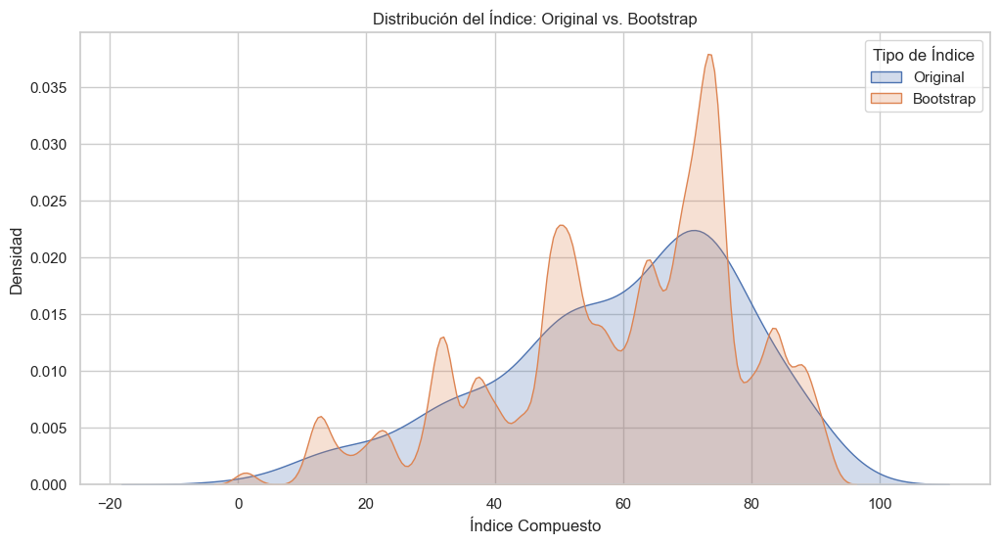

In [30]:
print('Figura 02.10')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Cifras de varianza e intervalo de confianza:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['safety', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='safety', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Basic education**

In [31]:
# basic_education
data = {
    'nuts_code': df['nuts_code'],
}


for var in basic_education:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)



**[Figura 02.11]**

In [32]:
print('Figura 02.11')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.11

Listado de indicadores y sus cargas absolutas:
|                             |      PC1 |      PC2 |      PC3 |      PC4 |
|:----------------------------|---------:|---------:|---------:|---------:|
| early_school_leavers        | 0.291903 | 0.54354  | 0.778195 | 0.117343 |
| low_achieving_maths_science | 0.707884 | 0.318837 | 0.135644 | 0.615503 |
| low_achieving_reading_level | 0.557686 | 0.292962 | 0.111332 | 0.768612 |
| lower_secondary_only        | 0.320436 | 0.719083 | 0.603008 | 0.128928 |

Indicadores no consistentes en PC1:
['lower_secondary_only', 'early_school_leavers']


In [33]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [34]:
# Agregación
beta = 1

X['basic_education'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['basic_education']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


**[Figura 02.12]**

Figura 02.12


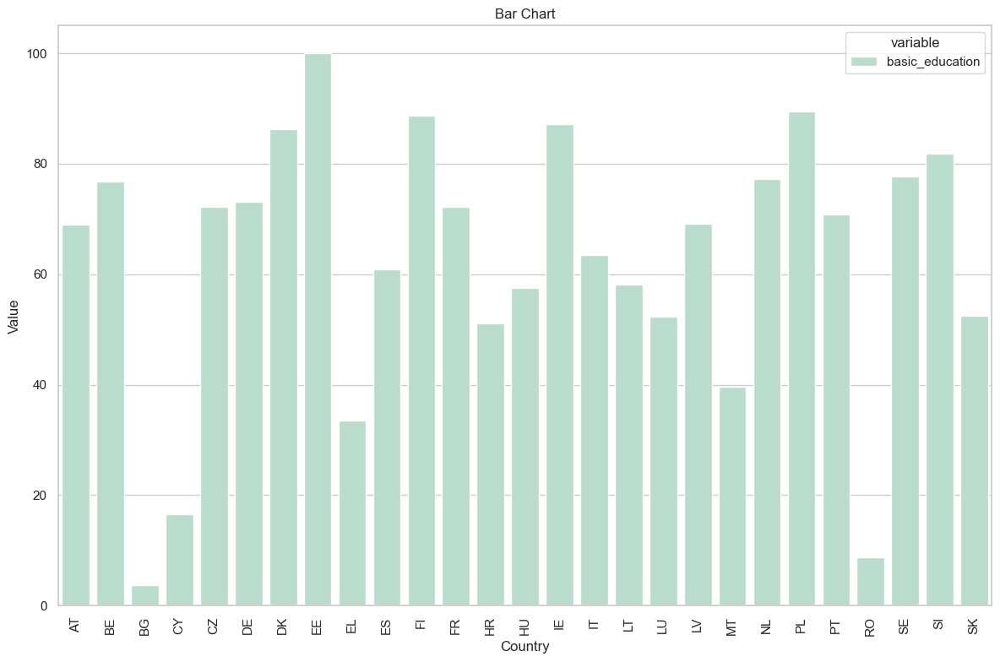

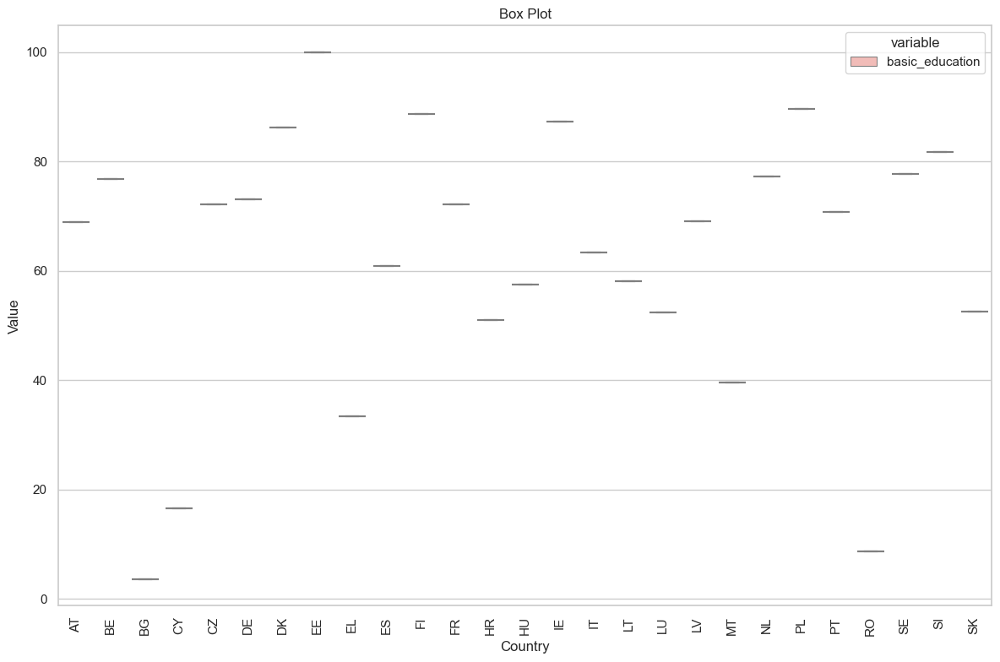

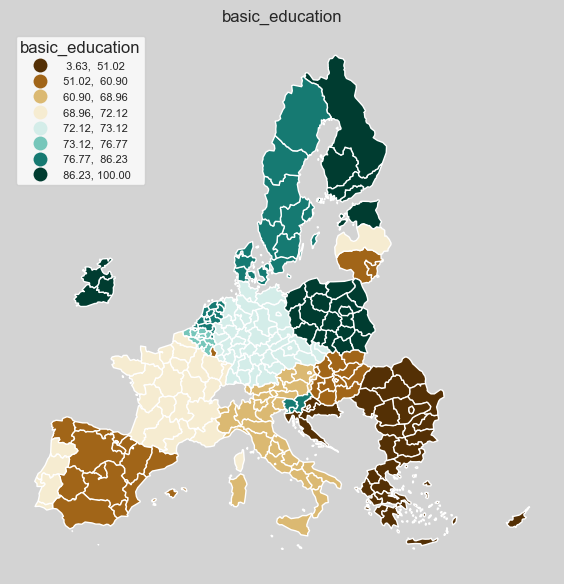

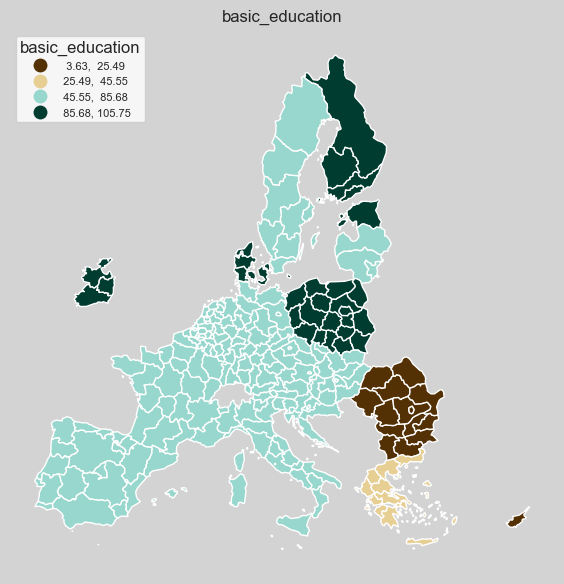

In [35]:
print('Figura 02.12')

variables = ['basic_education']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.13]** *Análisis de distintos betas*

Figura 02.13



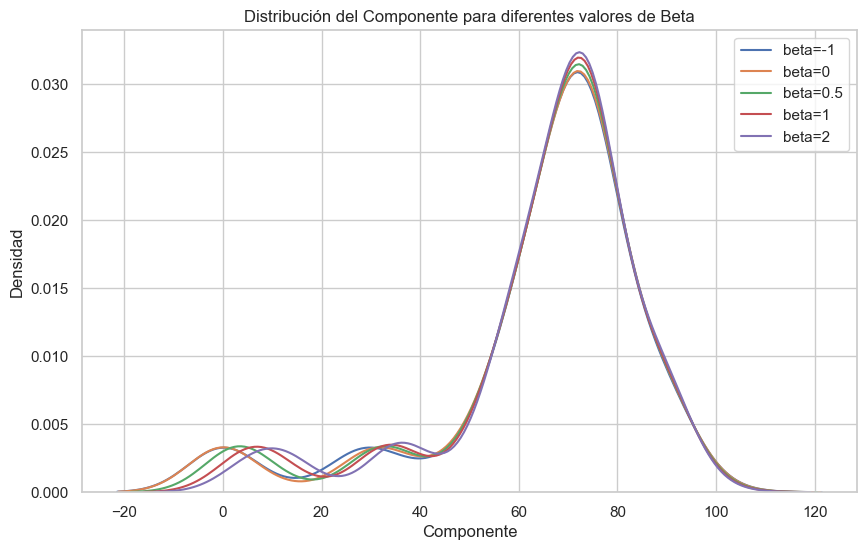

In [36]:
print('Figura 02.13')
print()

data = {
    'nuts_code': df['nuts_code'],
}


for var in basic_education:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'basic_education{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'basic_education{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.14]** *Añadir/Eliminar indicadores*

Figura 02.14


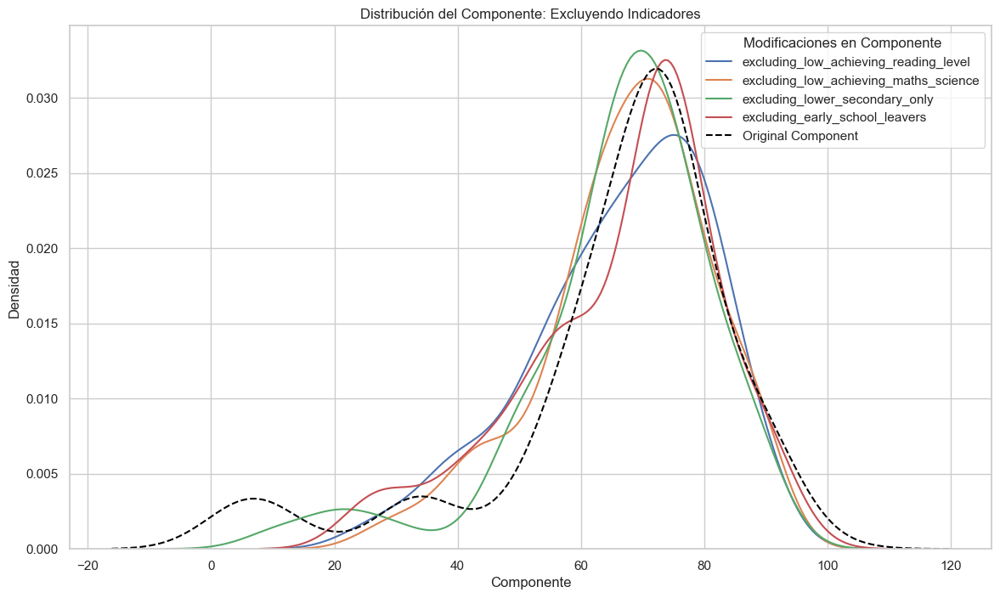

In [37]:
print('Figura 02.14')

data = {
    'nuts_code': df['nuts_code'],
}


for var in basic_education:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in basic_education:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['basic_education'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.15]** *Bootstraping*

Figura 02.15

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 388.5001914290028 |    65.75975207767598     |     65.68122055704235     |     65.83828359830962     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
390.3919605755606

Intervalo de Confianza al 95%:
(65.77645734469186, 63.2870336371545, 68.26588105222922)



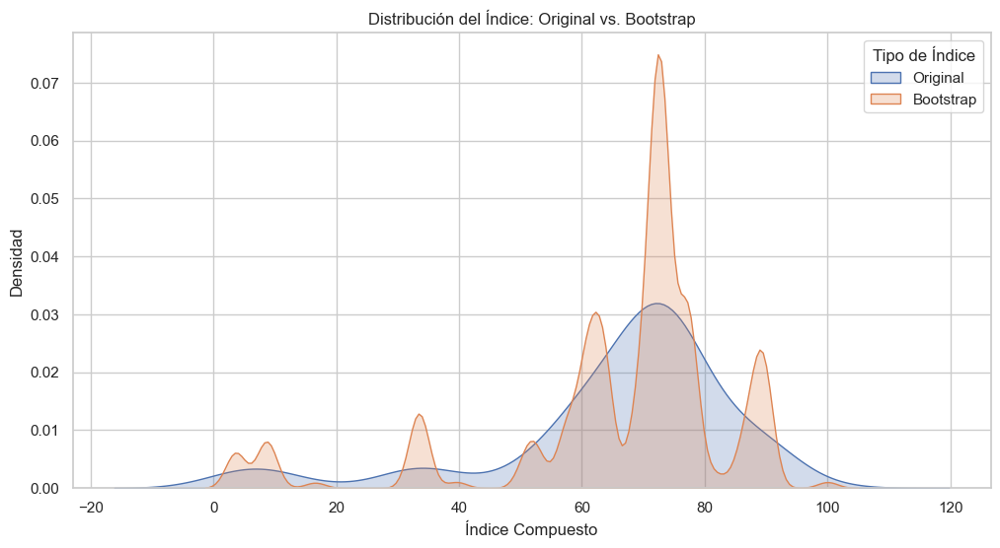

In [38]:
print('Figura 02.15')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['basic_education', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='basic_education', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Information and communications**

In [39]:
# information_communications

data = {
    'nuts_code': df['nuts_code'],
}


for var in information_communications:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)

**[Figura 02.16]**

In [40]:
print('Figura 02.16')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.16

Listado de indicadores y sus cargas absolutas:
|                                       |      PC1 |       PC2 |       PC3 |      PC4 |        PC5 |
|:--------------------------------------|---------:|----------:|----------:|---------:|-----------:|
| broadband_at_home                     | 0.310384 | 0.331025  | 0.787517  | 0.3347   | 0.248752   |
| digital_skills_above_basic            | 0.507011 | 0.260309  | 0.140925  | 0.188975 | 0.787151   |
| freedom_media                         | 0.42465  | 0.869225  | 0.0895973 | 0.235349 | 0.026531   |
| internet_access                       | 0.402287 | 0.0201628 | 0.227102  | 0.886669 | 0.00107571 |
| online_interaction_public_authorities | 0.551759 | 0.258271  | 0.548046  | 0.103409 | 0.563746   |

Indicadores no consistentes en PC1:
['broadband_at_home']


In [41]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [42]:
# Agregación
beta = 1

X['info_comm'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['info_comm']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')




**[Figura 02.17]**

Figura 02.17


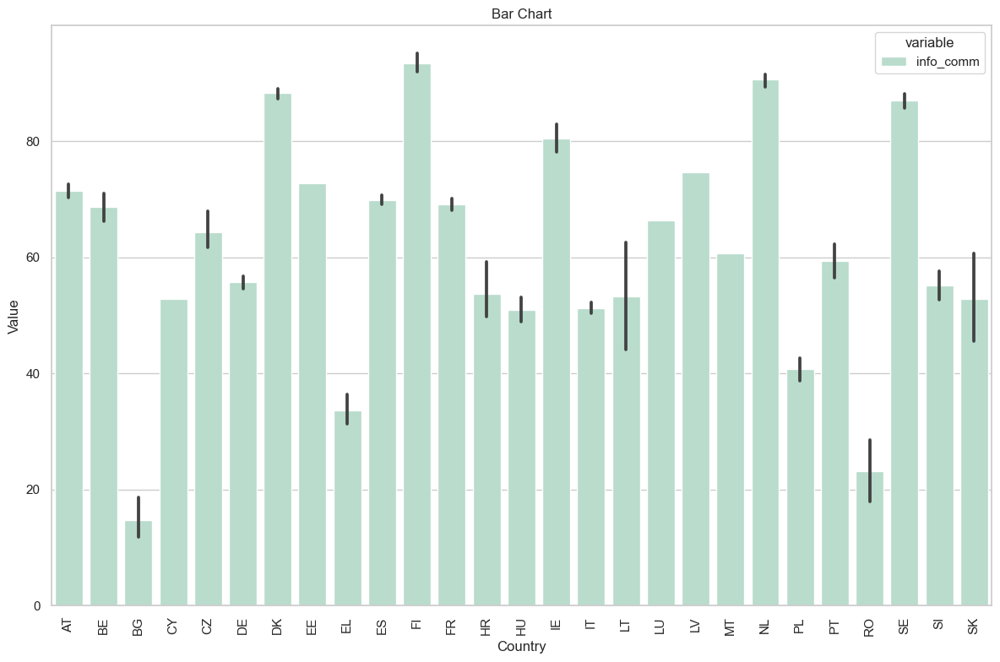

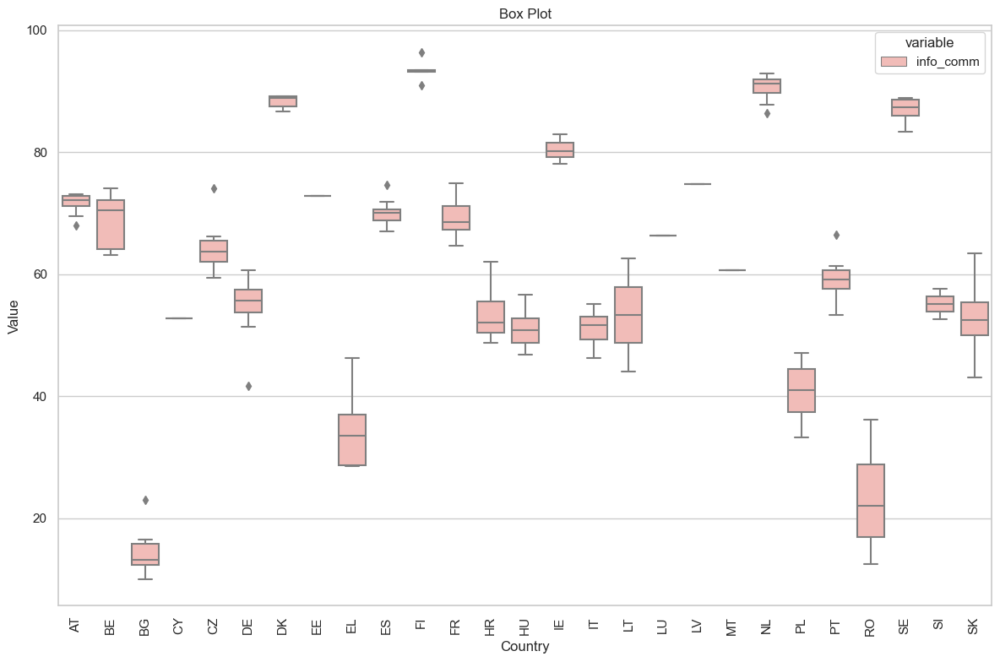

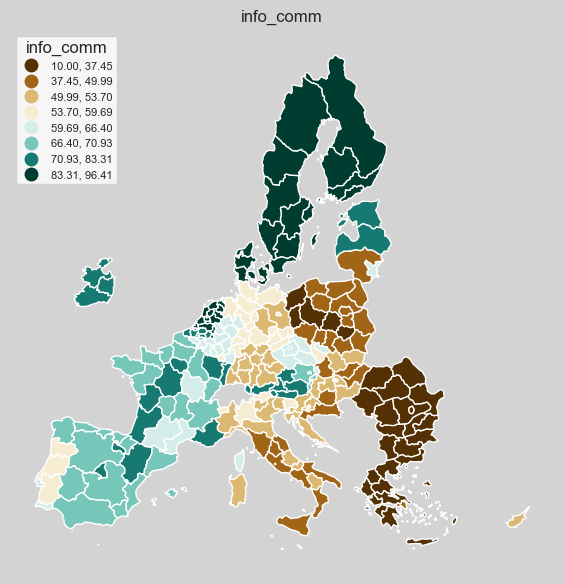

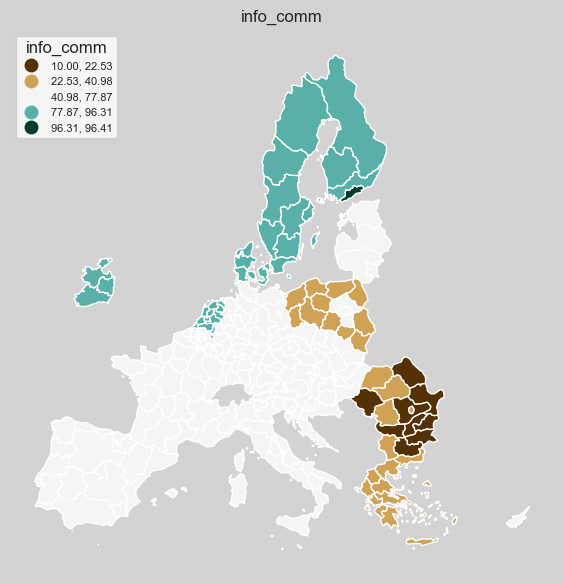

In [43]:
print('Figura 02.17')

variables = ['info_comm']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.18]** *Analisis de distintos betas*

Figura 02.18


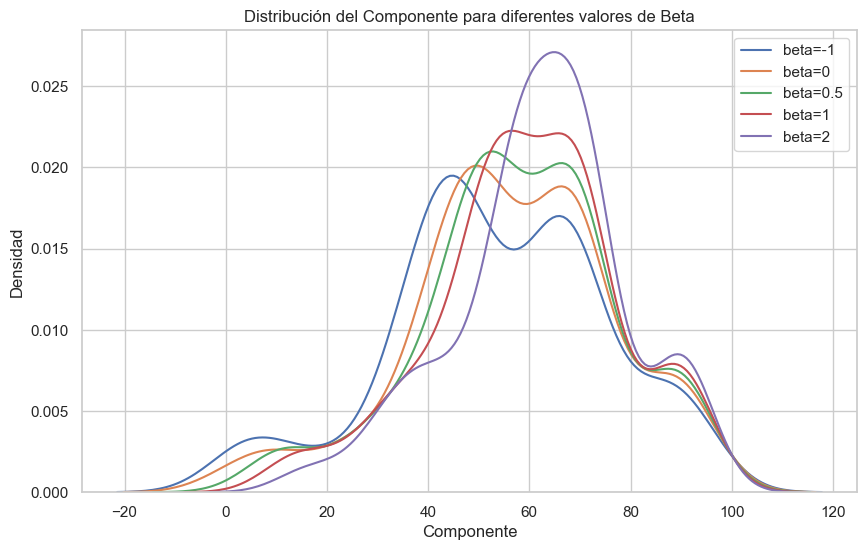

In [44]:
print('Figura 02.18')

data = {
    'nuts_code': df['nuts_code'],
}


for var in information_communications:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'info_comm{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'info_comm{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.19]** *Añadir/Eliminar indicadores*

Figura 02.19


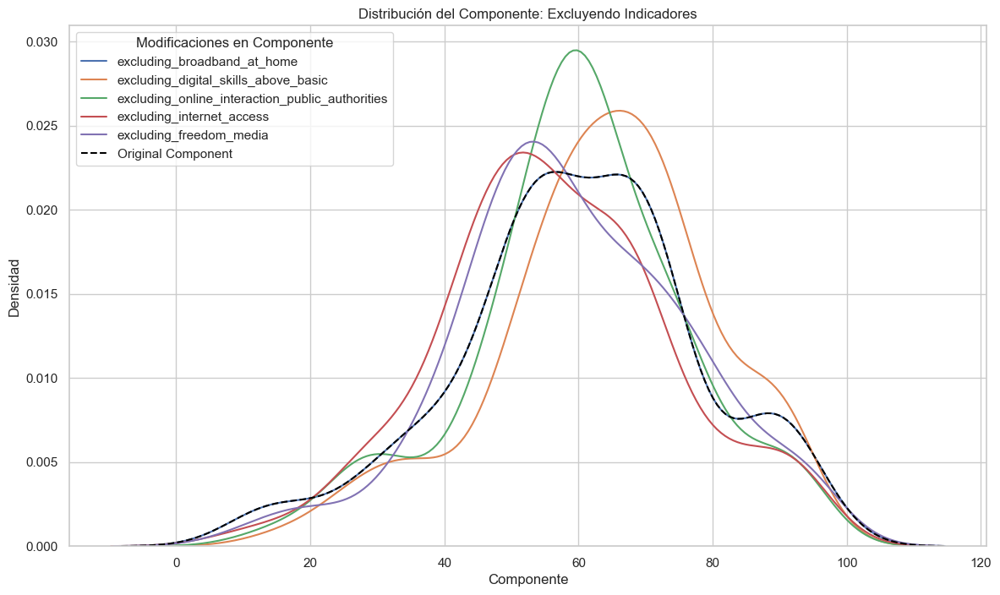

In [45]:
print('Figura 02.19')

data = {
    'nuts_code': df['nuts_code'],
}


for var in information_communications:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in information_communications:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['info_comm'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.20]** *Bootstraping*

Figura 02.20

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 329.3112134381235 |    59.641558780228756    |     59.56925655761555     |     59.71386100284196     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
330.935886434476

Intervalo de Confianza al 95%:
(59.61962824098209, 57.327598120848876, 61.9116583611153)



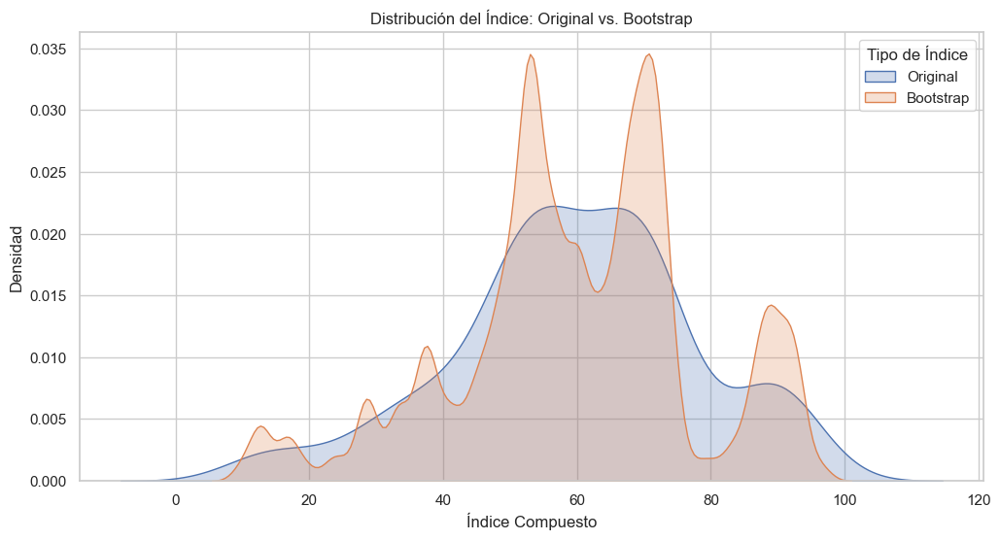

In [46]:
print('Figura 02.20')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['info_comm', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='info_comm', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Health**

In [47]:
# health

data = {
    'nuts_code': df['nuts_code'],
}


for var in health:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.21]**

In [48]:
print('Figura 02.21')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())



Figura 02.21

Listado de indicadores y sus cargas absolutas:
|                           |       PC1 |      PC2 |      PC3 |       PC4 |       PC5 |
|:--------------------------|----------:|---------:|---------:|----------:|----------:|
| cancer_death              | 0.454981  | 0.479436 | 0.153791 | 0.572276  | 0.460416  |
| heart_death               | 0.537331  | 0.196752 | 0.139202 | 0.0205733 | 0.807938  |
| positive_emotions         | 0.408008  | 0.470012 | 0.743792 | 0.241197  | 0.0348846 |
| subjective_health_status  | 0.0841284 | 0.637369 | 0.528178 | 0.544437  | 0.1063    |
| years_life_lost_pollution | 0.575082  | 0.322924 | 0.353233 | 0.563463  | 0.350339  |

Indicadores no consistentes en PC1:
['subjective_health_status']


In [49]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [50]:
# Agregación
beta = 1

X['health'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['health']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


**[Figura 02.22]**

Figura 02.22


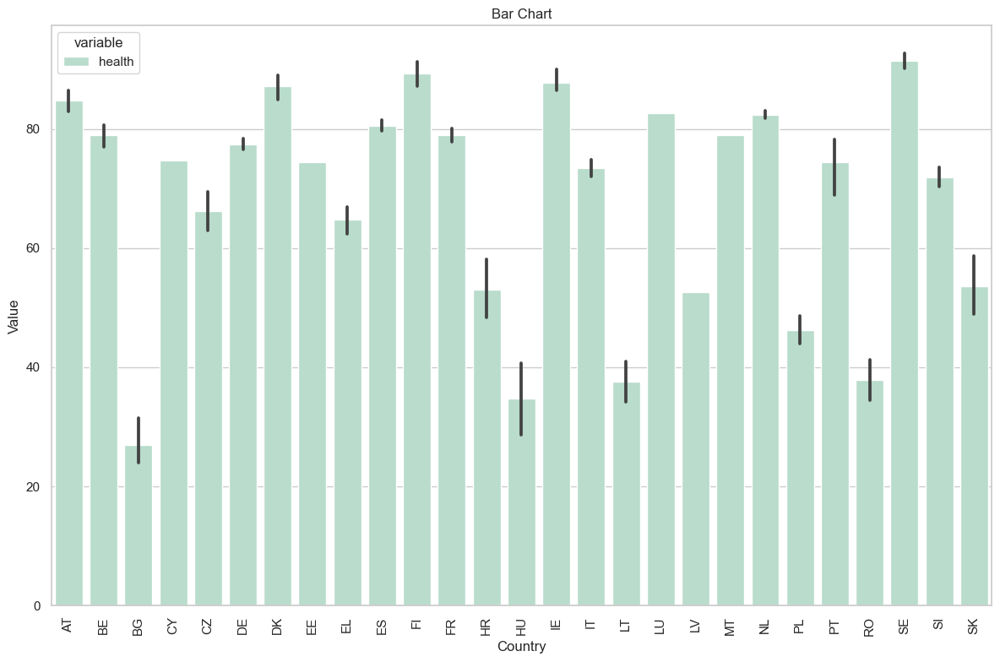

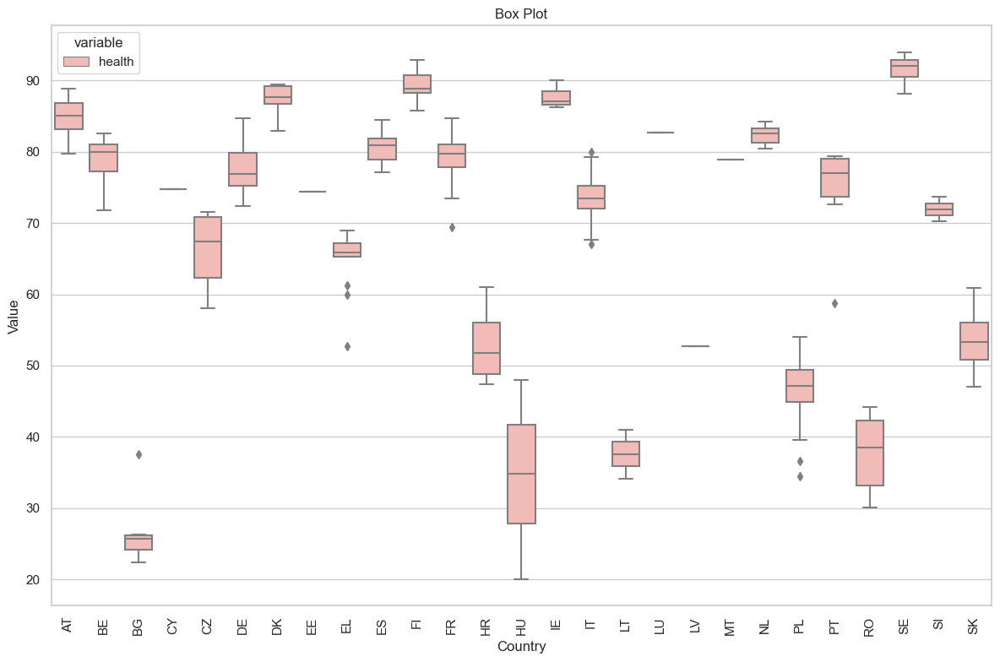

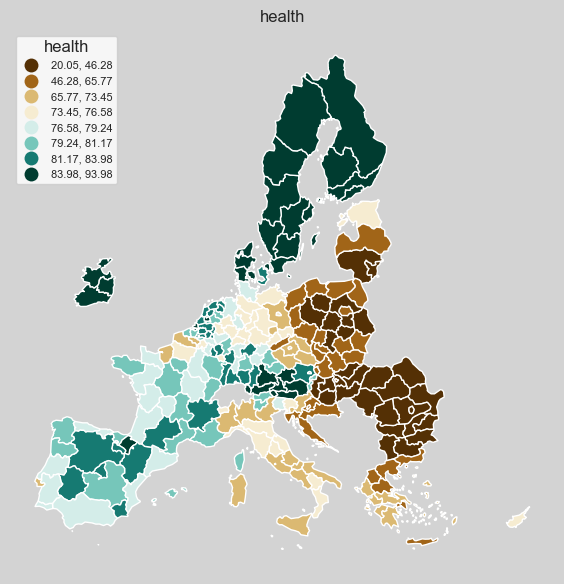

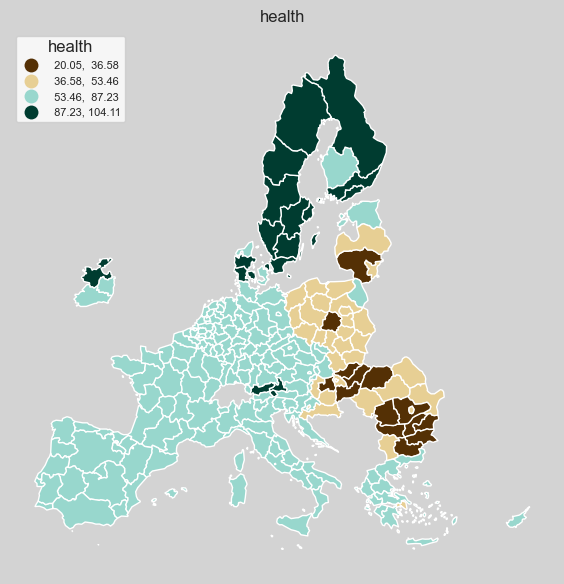

In [51]:
print('Figura 02.22')
variables = ['health']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.23]** *Analisis de distintos betas*

Figura 02.23


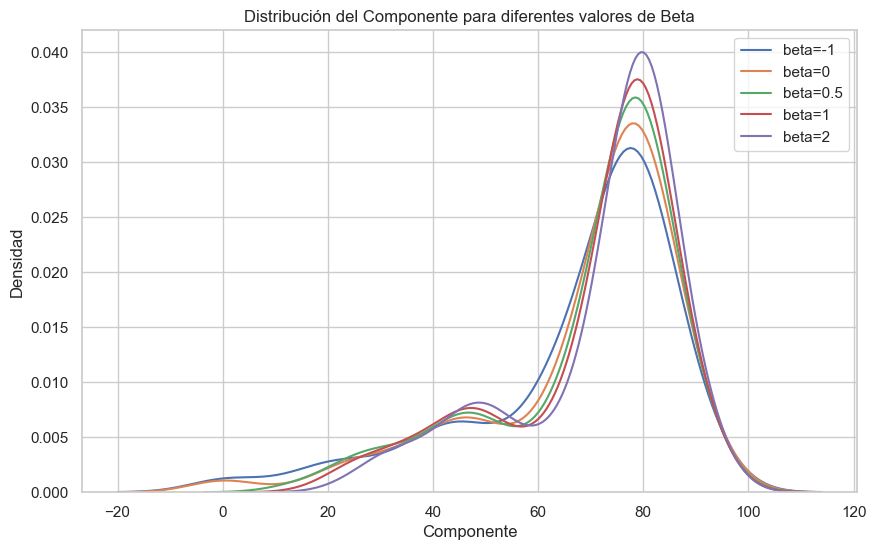

In [52]:
print('Figura 02.23')

data = {
    'nuts_code': df['nuts_code'],
}


for var in health:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'health{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'health{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.24]** *Añadir/Eliminar indicadores*

Figura 02.24


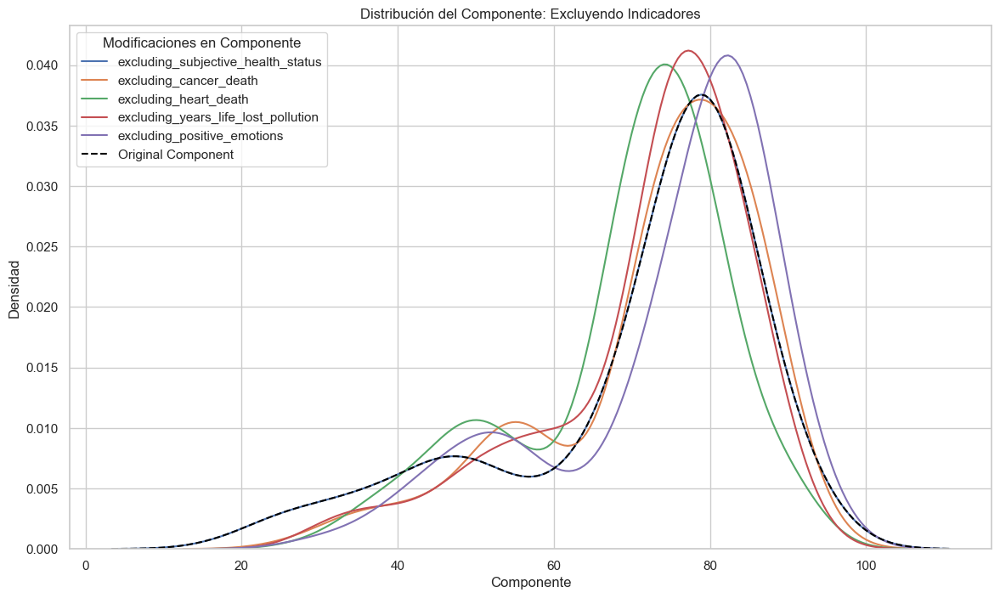

In [53]:
print('Figura 02.24')

data = {
    'nuts_code': df['nuts_code'],
}


for var in health:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in health:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['health'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.25]** *Bootstraping*

Figura 02.25

Bootstrap:
+---+--------------------+--------------------------+---------------------------+---------------------------+
|   |      Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+--------------------+--------------------------+---------------------------+---------------------------+
| 0 | 276.34209400597354 |    70.62307318161109     |     70.55684056535654     |     70.68930579786564     |
+---+--------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
279.07354156503385

Intervalo de Confianza al 95%:
(70.57824225093353, 68.47345734675044, 72.68302715511662)



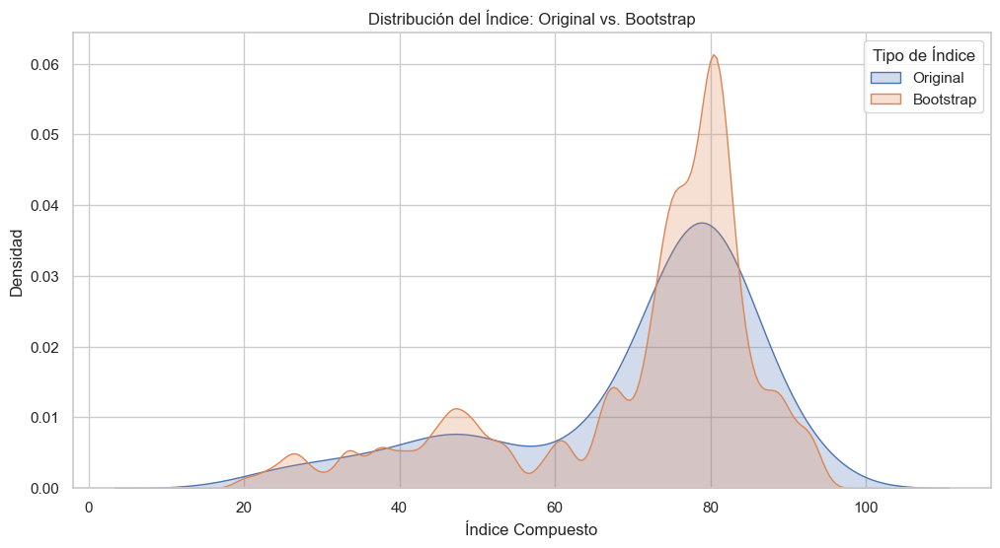

In [54]:
print('Figura 02.25')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['health', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='health', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Enviromental quality**

In [55]:
# enviromental_quality

data = {
    'nuts_code': df['nuts_code'],
}


for var in enviromental_quality:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.26]**

In [56]:
print('Figura 02.26')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.26

Listado de indicadores y sus cargas absolutas:
|                       |       PC1 |      PC2 |      PC3 |      PC4 |
|:----------------------|----------:|---------:|---------:|---------:|
| bathing_water_quality | 0.793602  | 0.395301 | 0.401427 | 0.229759 |
| pollution_no2         | 0.21736   | 0.32465  | 0.537665 | 0.747177 |
| pollution_pm25        | 0.56705   | 0.377786 | 0.397095 | 0.614856 |
| pollution_somo35      | 0.0374753 | 0.771762 | 0.62617  | 0.104354 |

Indicadores no consistentes en PC1:
['pollution_no2', 'pollution_somo35']


In [57]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

In [58]:
# Agregación
beta = 1

X['env_quality'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['env_quality']

componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


**[Figura 02.27]**

Figura 02.27


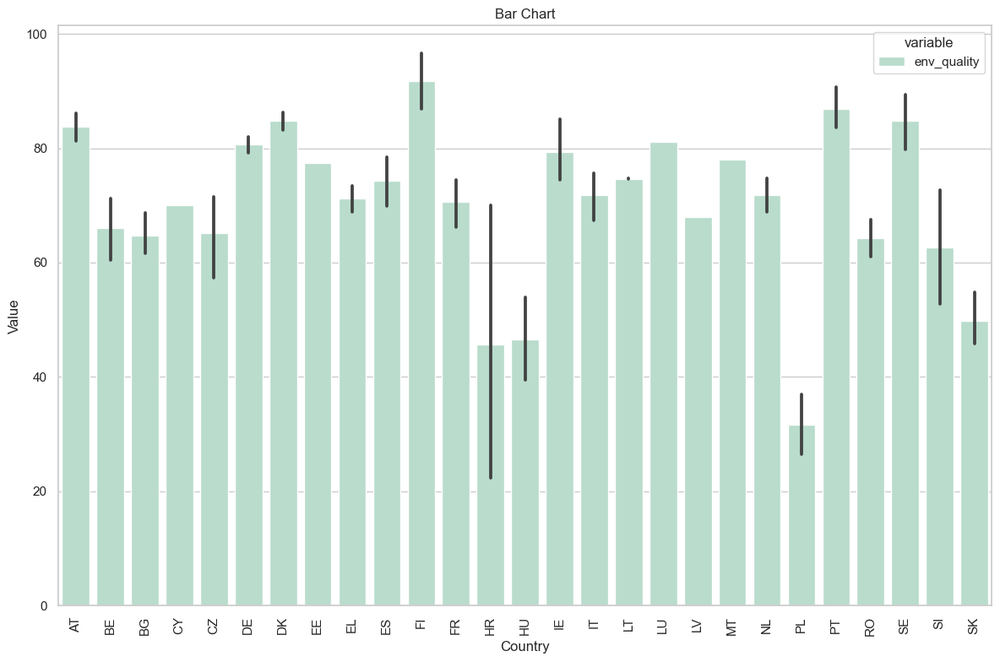

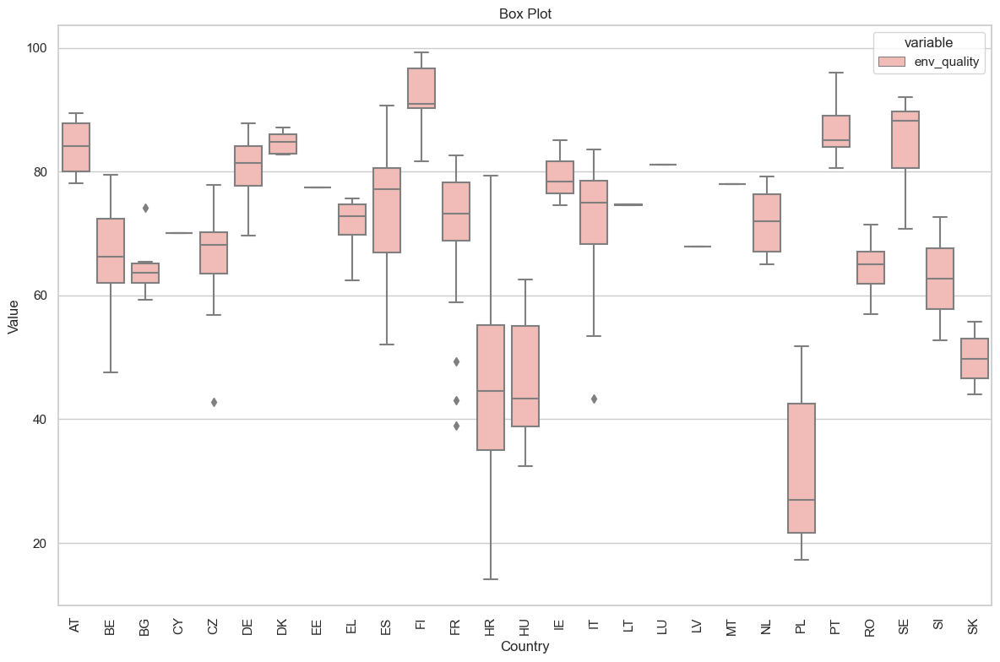

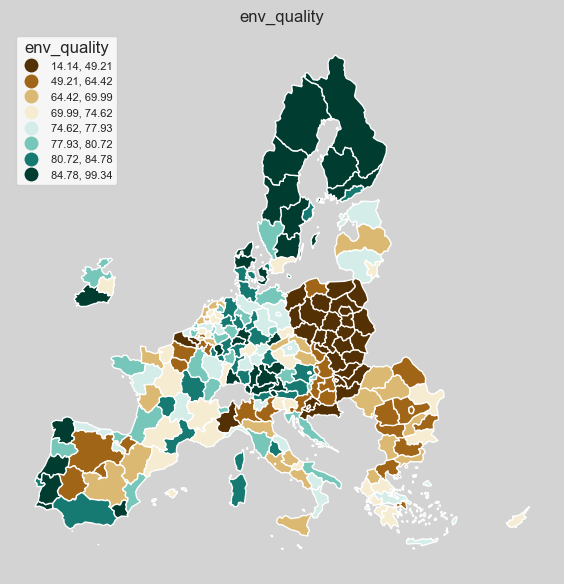

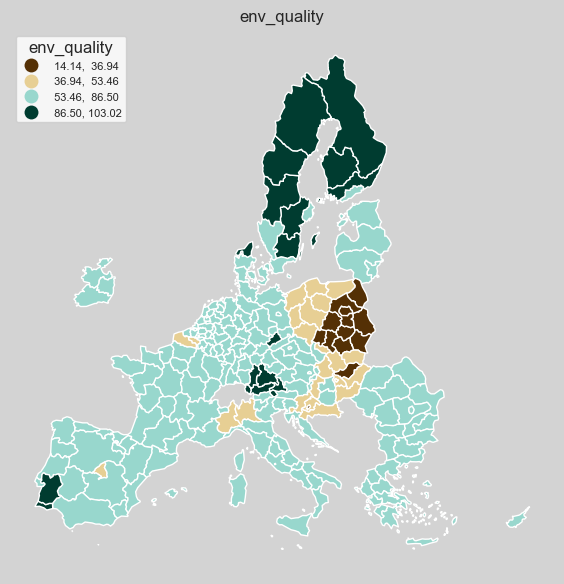

In [59]:
print('Figura 02.27')
variables = ['env_quality']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.28]** *Analisis de distintos betas*

Figura 02.28


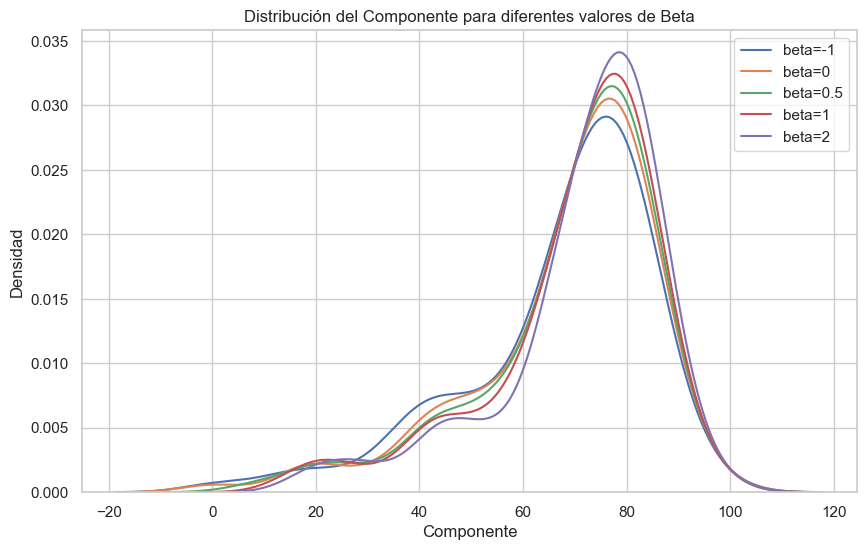

In [60]:
print('Figura 02.28')

data = {
    'nuts_code': df['nuts_code'],
}


for var in enviromental_quality:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'env_quality{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'env_quality{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.29]** *Añadir/Eliminar indicadores*

Figura 02.29


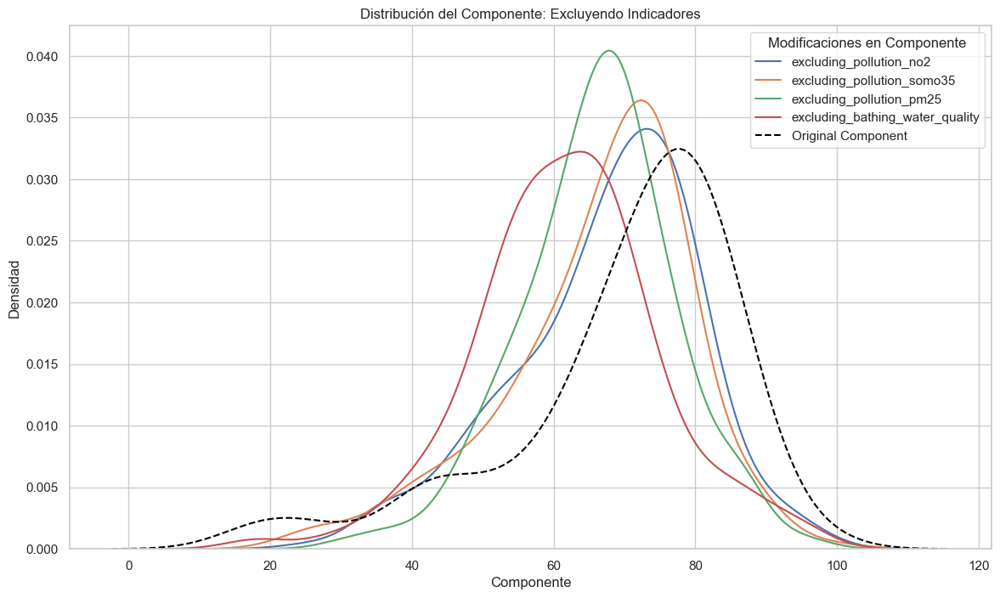

In [61]:
print('Figura 02.29')

data = {
    'nuts_code': df['nuts_code'],
}


for var in enviromental_quality:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in enviromental_quality:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['env_quality'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.30]** *Bootstraping*

Figura 02.30

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 271.6214307864396 |    69.95676172648962     |     69.89109726233019     |     70.02242619064904     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
272.6133385231864

Intervalo de Confianza al 95%:
(69.97684969188123, 67.89656899595441, 72.05713038780804)



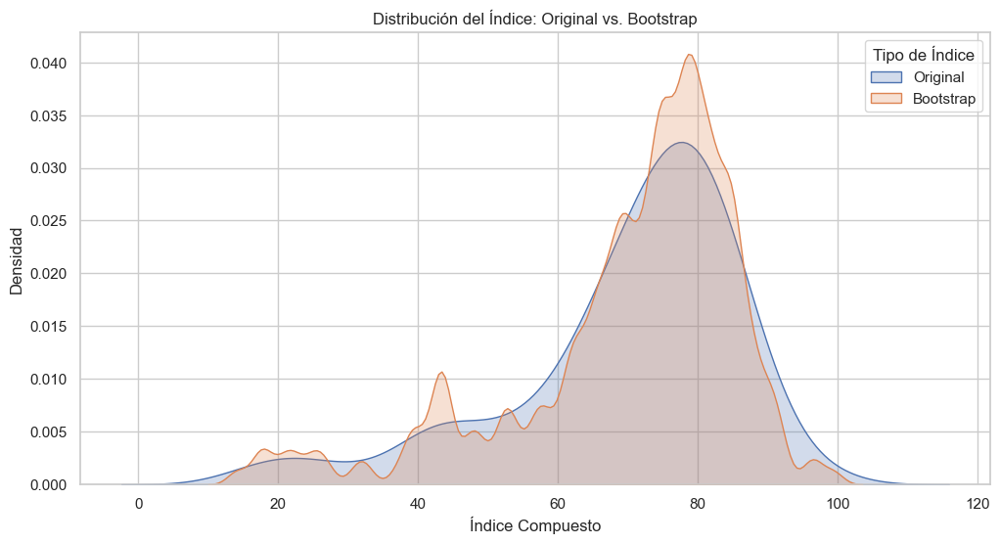

In [62]:
print('Figura 02.30')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['env_quality', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='env_quality', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Trust in governance**

In [63]:
# trust_governance

data = {
    'nuts_code': df['nuts_code'],
}


for var in trust_governance:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.31]**

In [64]:
print('Figura 02.31')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.31

Listado de indicadores y sus cargas absolutas:
|                           |      PC1 |      PC2 |       PC3 |        PC4 |       PC5 |       PC6 |
|:--------------------------|---------:|---------:|----------:|-----------:|----------:|----------:|
| female_participation      | 0.434098 | 0.898803 | 0.042526  | 0.00344979 | 0.0107744 | 0.0421345 |
| institution_quality       | 0.420443 | 0.184399 | 0.249984  | 0.427598   | 0.568232  | 0.470112  |
| trust_legal_system        | 0.451305 | 0.259849 | 0.143129  | 0.369608   | 0.145491  | 0.741983  |
| trust_national_government | 0.425959 | 0.197604 | 0.0877302 | 0.0670106  | 0.746565  | 0.45822   |
| trust_police              | 0.380989 | 0.199024 | 0.198643  | 0.822157   | 0.289513  | 0.126563  |
| voiced_opinion            | 0.323291 | 0.10941  | 0.931696  | 0.0102465  | 0.121048  | 0.0263906 |

Indicadores no consistentes en PC1:
['trust_police', 'voiced_opinion']


In [65]:
X.drop(columns=['trust_police', 'voiced_opinion'],inplace=True)

**[Figura 02.32]**

Figura 02.32


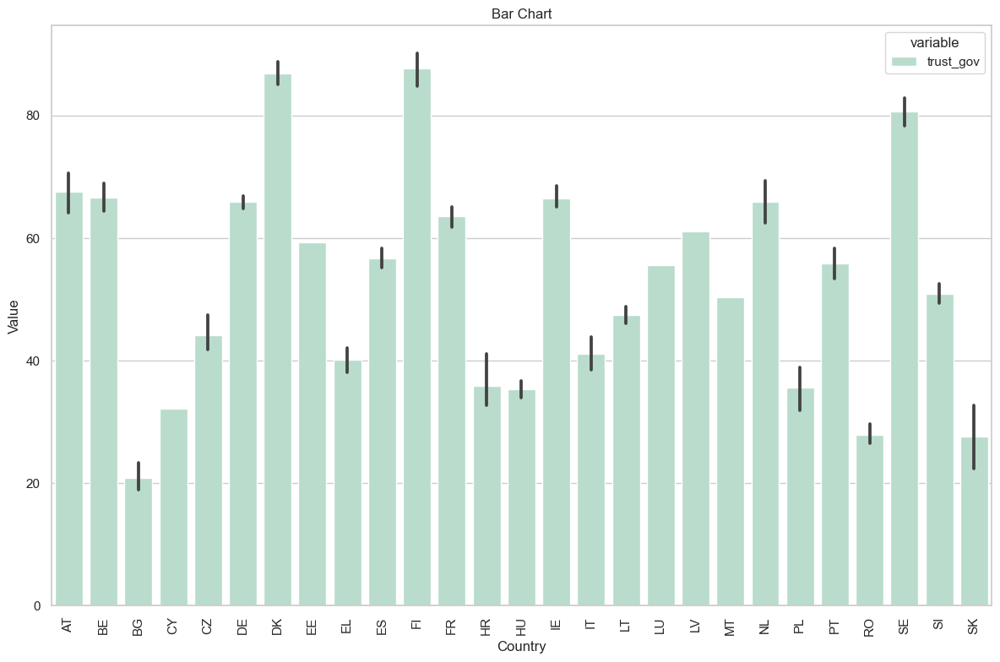

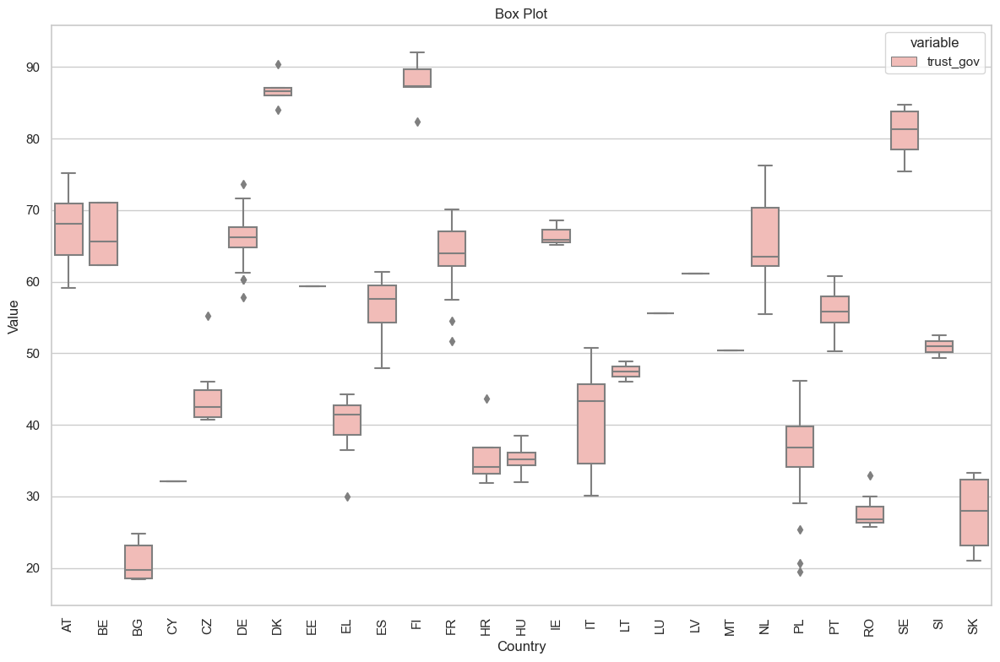

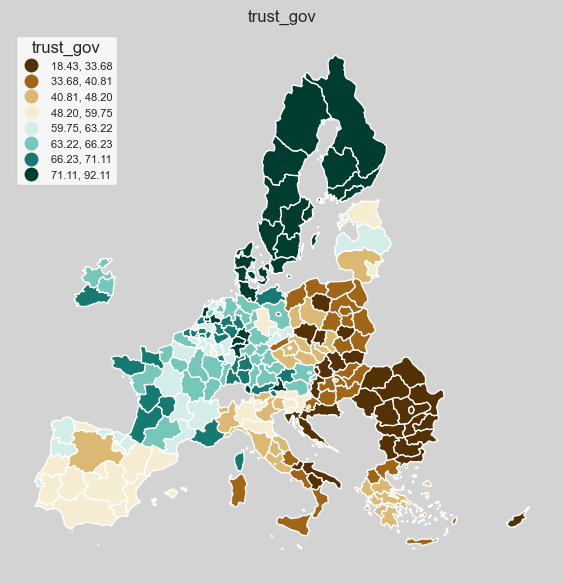

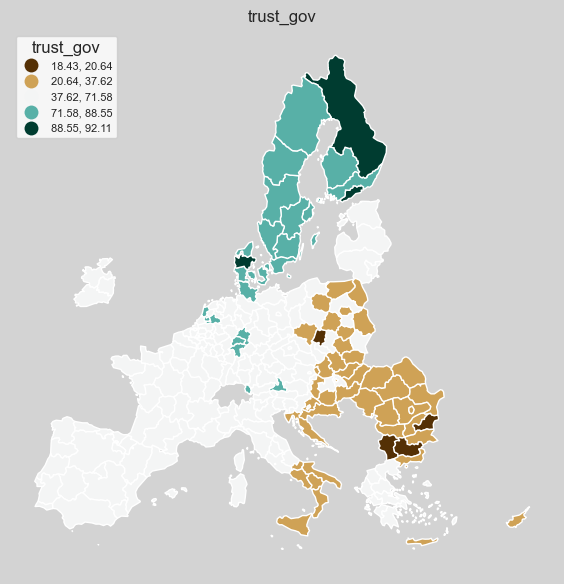

In [66]:
# Agregación
beta = 1

X['trust_gov'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['trust_gov']
componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')

# Graficos y mapas
print('Figura 02.32')
variables = ['trust_gov']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.33]** *Analisis de distintos betas*

Figura 02.33


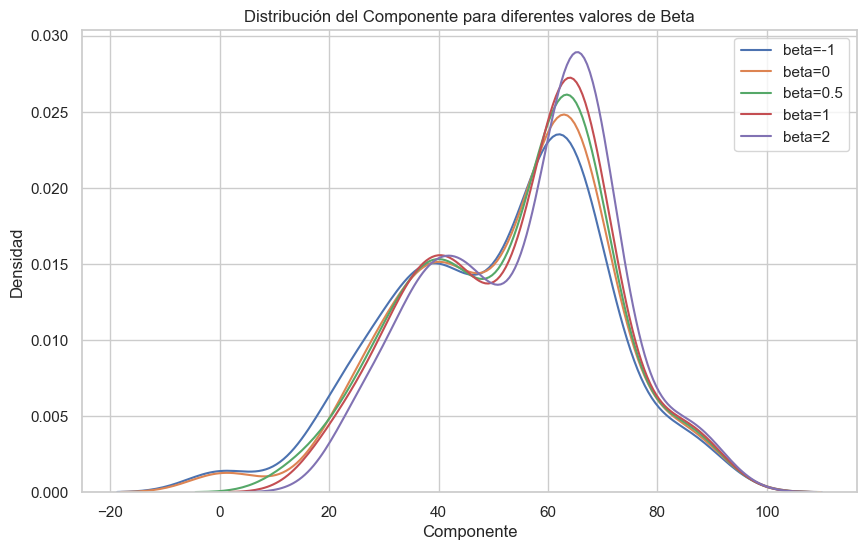

In [67]:
print('Figura 02.33')

data = {
    'nuts_code': df['nuts_code'],
}


for var in trust_governance:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=['trust_police', 'voiced_opinion'],inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'trust_gov{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'trust_gov{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.34]** *Añadir/Eliminar indicadores*

Figura 02.34


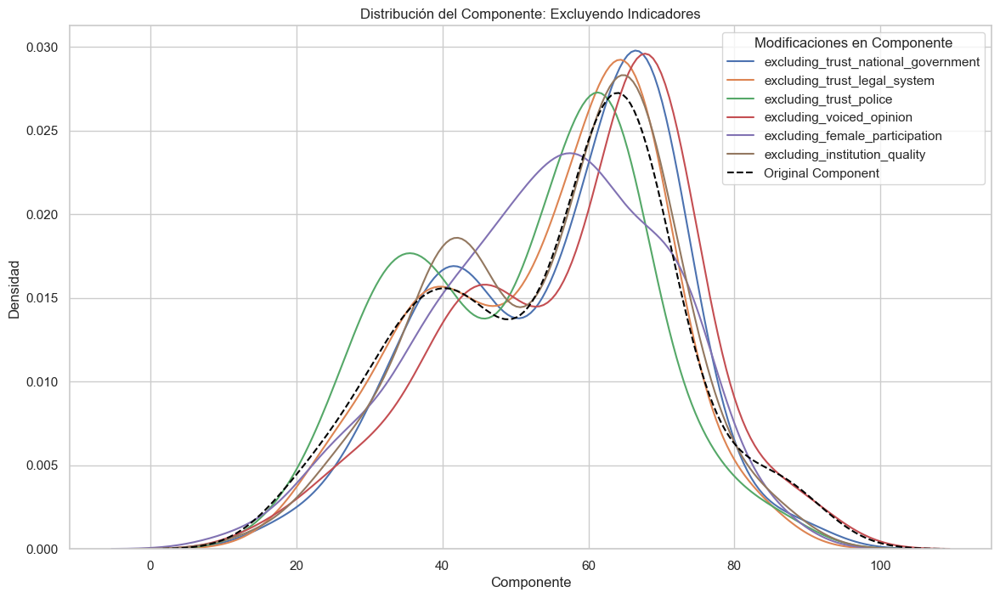

In [68]:
print('Figura 02.34')

data = {
    'nuts_code': df['nuts_code'],
}


for var in trust_governance:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in trust_governance:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['trust_gov'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.35]** *Bootstrap*

Figura 02.35

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 278.6128625626363 |    54.696082948936564    |     54.62957876486324     |     54.76258713300989     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
279.4938135373812

Intervalo de Confianza al 95%:
(54.65783936986781, 52.55147020708108, 56.764208532654536)



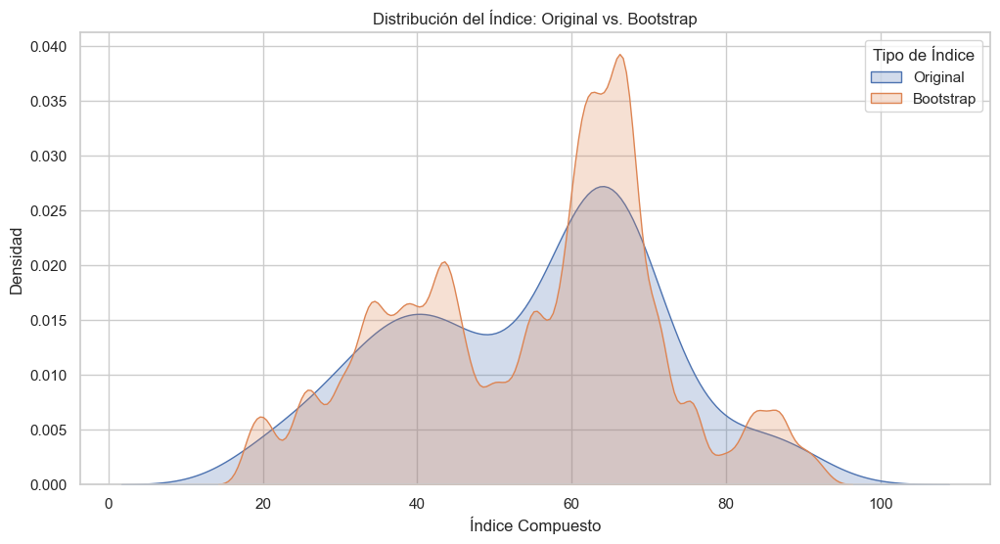

In [69]:
print('Figura 02.35')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['trust_gov', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='trust_gov', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Freedom of choice**

In [70]:
# freedom_choice

data = {
    'nuts_code': df['nuts_code'],
}


for var in freedom_choice:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.36]**

In [71]:
print('Figura 02.36')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.36

Listado de indicadores y sus cargas absolutas:
|                         |      PC1 |       PC2 |      PC3 |      PC4 |       PC5 |
|:------------------------|---------:|----------:|---------:|---------:|----------:|
| freedom_life_choices    | 0.447425 | 0.62276   | 0.295716 | 0.341801 | 0.455746  |
| institutions_corruption | 0.515594 | 0.0585685 | 0.570122 | 0.374439 | 0.515256  |
| job_opp                 | 0.558612 | 0.0939296 | 0.692123 | 0.436133 | 0.0994197 |
| teenage_pregnancy       | 0.200251 | 0.668048  | 0.25247  | 0.138444 | 0.65628   |
| young_people_neet       | 0.426411 | 0.391955  | 0.211513 | 0.730471 | 0.29363   |

Indicadores no consistentes en PC1:
['teenage_pregnancy']


In [72]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

**[Figura 02.37]**

Figura 02.37


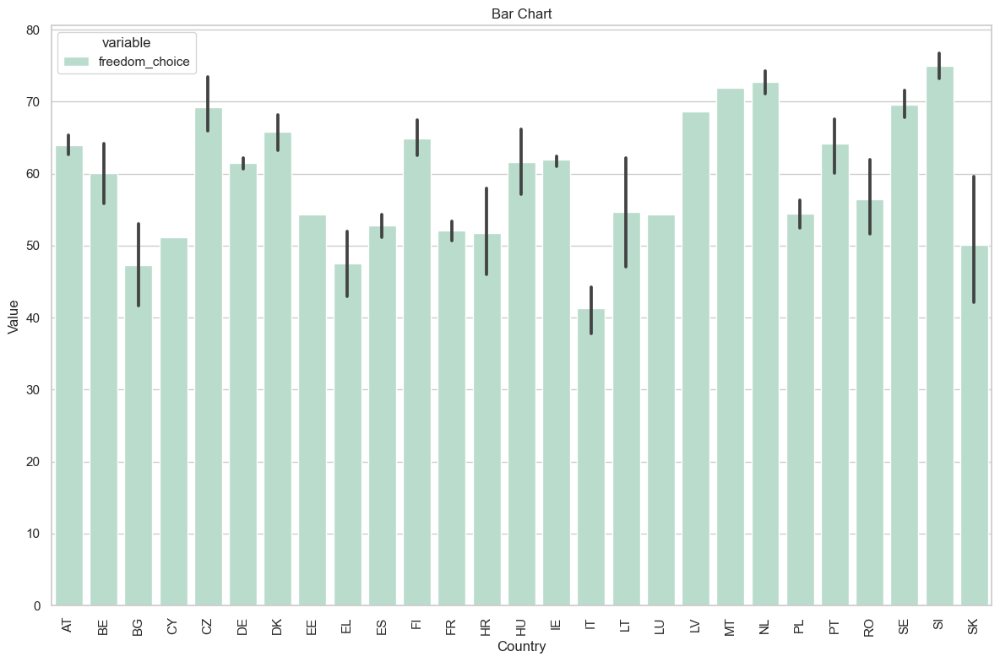

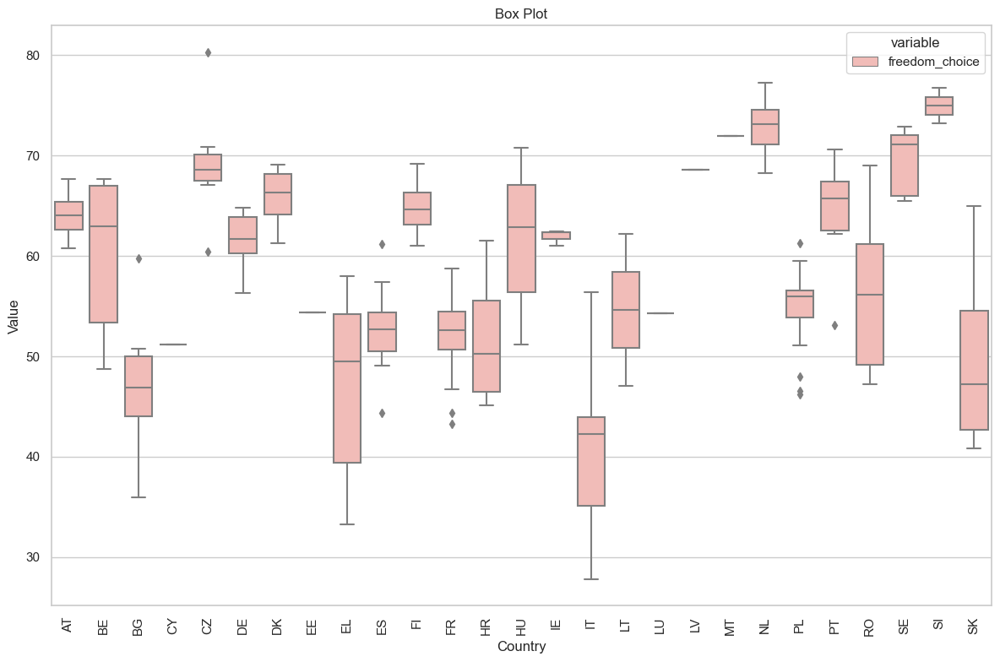

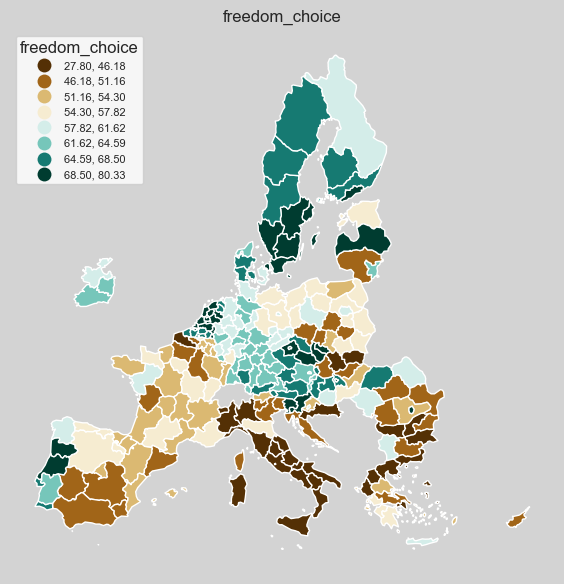

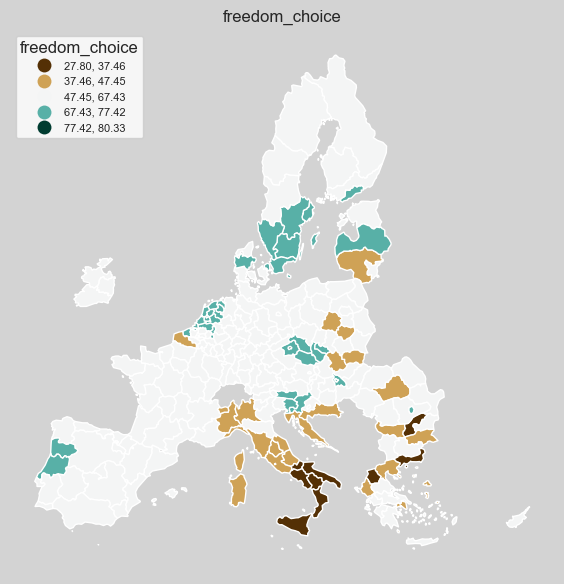

In [73]:
# Agregación
beta = 1

X['freedom_choice'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['freedom_choice']
componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


# Graficos y mapas
print('Figura 02.37')
variables = ['freedom_choice']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.38]** *Analisis de distintos betas*

Figura 02.38


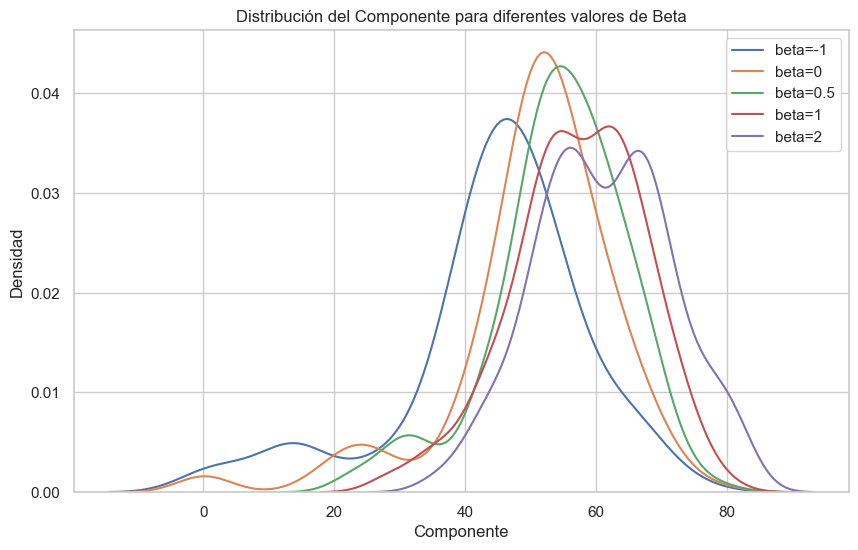

In [74]:
print('Figura 02.38')

data = {
    'nuts_code': df['nuts_code'],
}


for var in freedom_choice:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'freedom_choice{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'freedom_choice{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.39]** *Añadir/Eliminar indicadores*

Figura 02.39


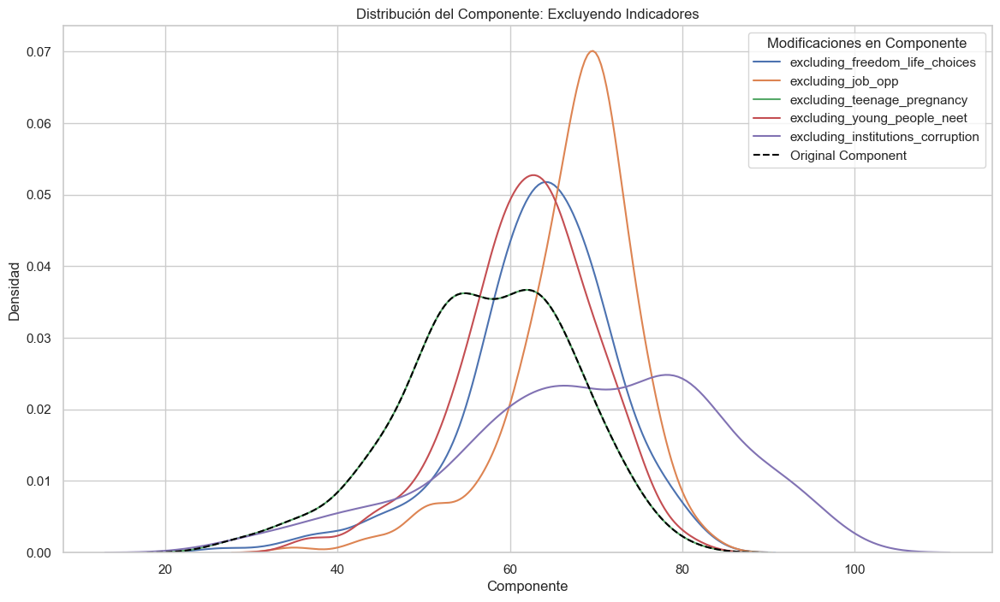

In [75]:
print('Figura 02.39')

data = {
    'nuts_code': df['nuts_code'],
}


for var in freedom_choice:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in freedom_choice:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['freedom_choice'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.40]** *Bootstraping*

Figura 02.40

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 97.31473386525943 |    57.26219540846651     |     57.22289132367802     |      57.301499493255      |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
98.29801467533683

Intervalo de Confianza al 95%:
(57.26671325939588, 56.017545514675625, 58.51588100411613)



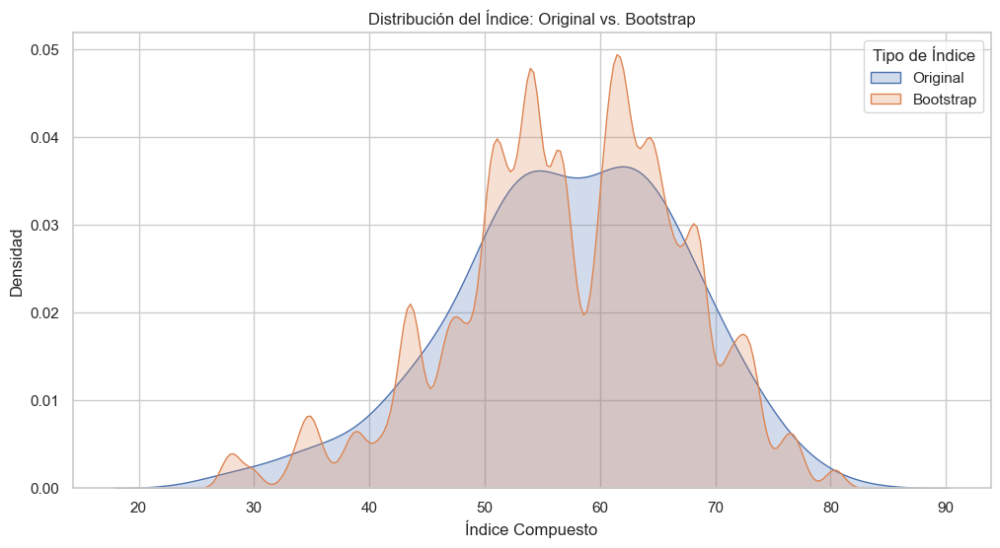

In [76]:
print('Figura 02.40')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['freedom_choice', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='freedom_choice', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Inclusive society**

In [77]:
# inclusive_society

data = {
    'nuts_code': df['nuts_code']}


for var in inclusive_society:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.41]**

In [78]:
print('Figura 02.41')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())

Figura 02.41

Listado de indicadores y sus cargas absolutas:
|                          |      PC1 |      PC2 |      PC3 |      PC4 |        PC5 |
|:-------------------------|---------:|---------:|---------:|---------:|-----------:|
| institution_impartiality | 0.327112 | 0.499371 | 0.766581 | 0.236513 | 0.00645248 |
| tt_immigrants            | 0.441524 | 0.196867 | 0.189795 | 0.440151 | 0.732493   |
| tt_lgtb                  | 0.573842 | 0.123796 | 0.280966 | 0.360149 | 0.668379   |
| tt_minorities            | 0.532147 | 0.40981  | 0.254401 | 0.69387  | 0.0519565  |
| women_respect            | 0.292538 | 0.727051 | 0.482358 | 0.37305  | 0.118252   |

Indicadores no consistentes en PC1:
['institution_impartiality', 'women_respect']


In [79]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

**[Figura 02.42]**

Figura 02.42


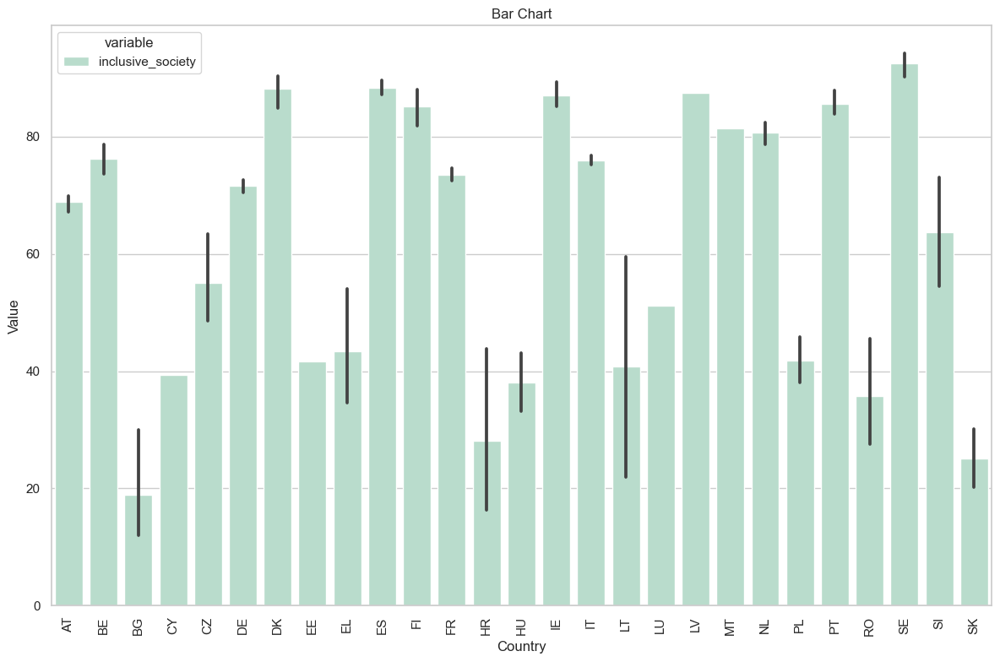

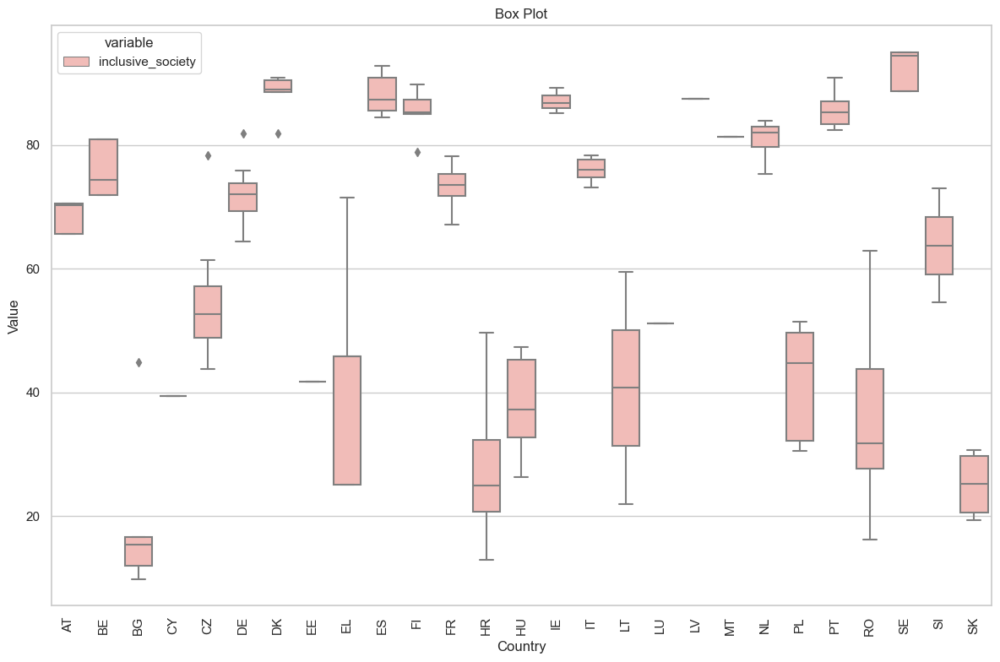

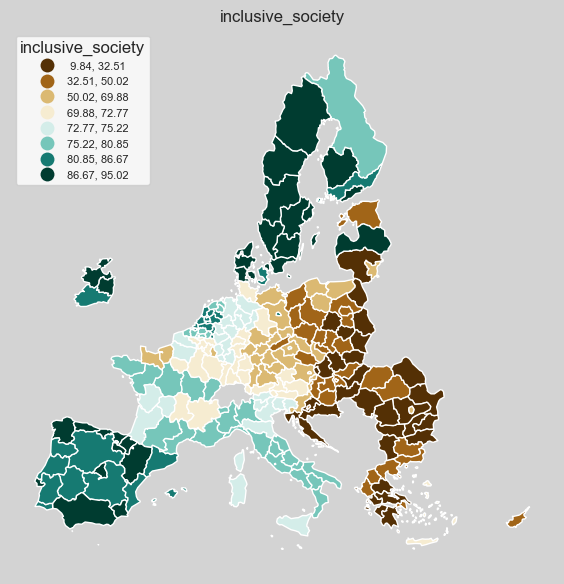

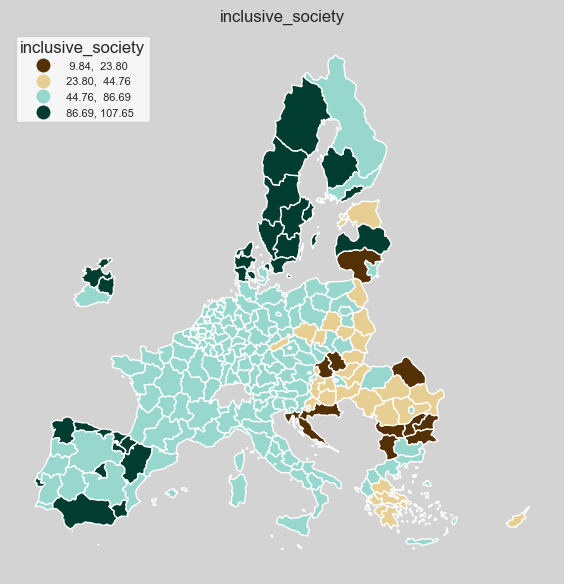

In [80]:
# Agregación
beta = 1

X['inclusive_society'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['inclusive_society']
componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


# Graficos y mapas
print('Figura 02.42')
variables = ['inclusive_society']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.43]** *Analisis de distintos betas*

Figura 02.43


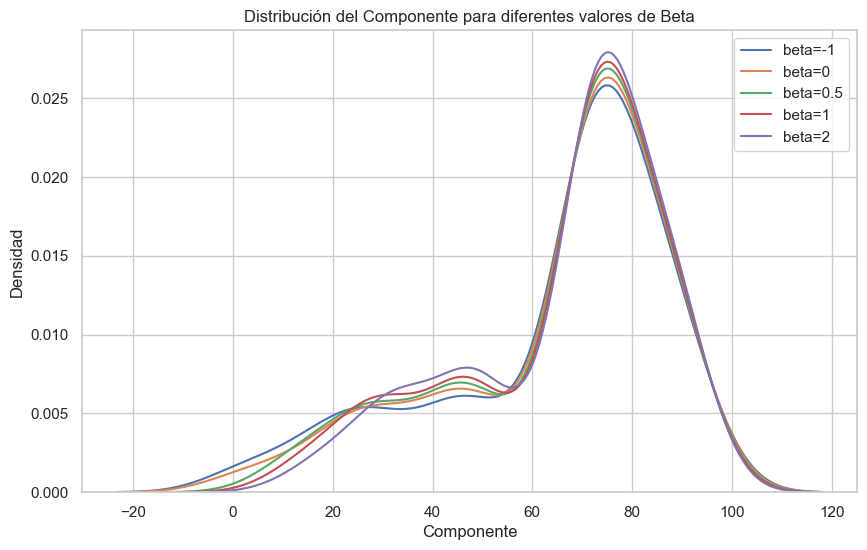

In [81]:
print('Figura 02.43')

data = {
    'nuts_code': df['nuts_code'],
}


for var in inclusive_society:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'inclusive_society{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'inclusive_society{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.44]** *Añadir/Eliminar indicadores*

Figura 02.44


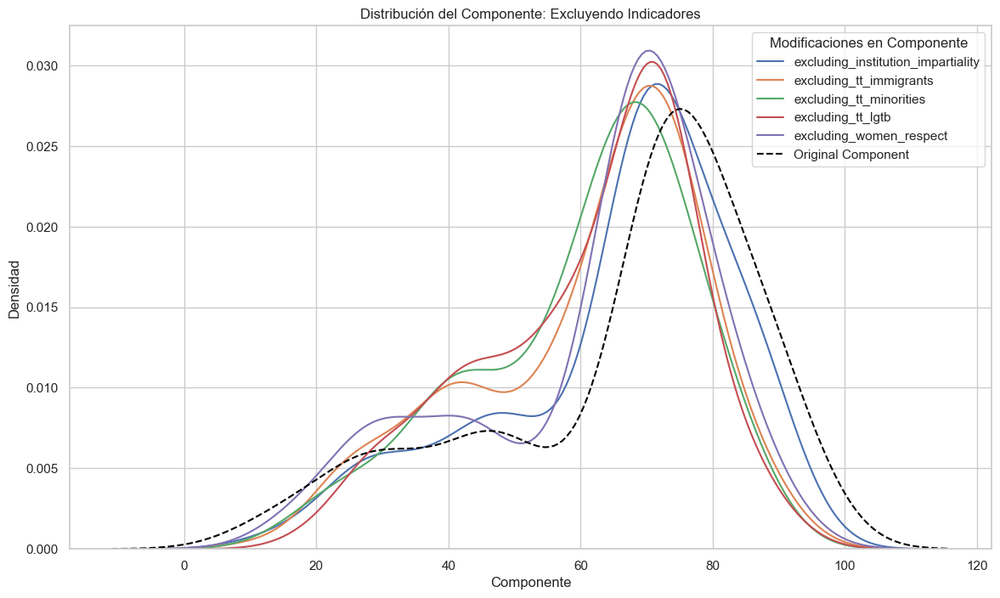

In [82]:
print('Figura 02.44')

data = {
    'nuts_code': df['nuts_code'],
}


for var in inclusive_society:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in inclusive_society:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['inclusive_society'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.45]** *Bootstraping*

Figura 02.45

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 431.1986450344867 |    66.17583752664768     |     66.09310294368484     |     66.25857210961053     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
432.9273059468839

Intervalo de Confianza al 95%:
(66.18174520174546, 63.560208889096835, 68.80328151439407)



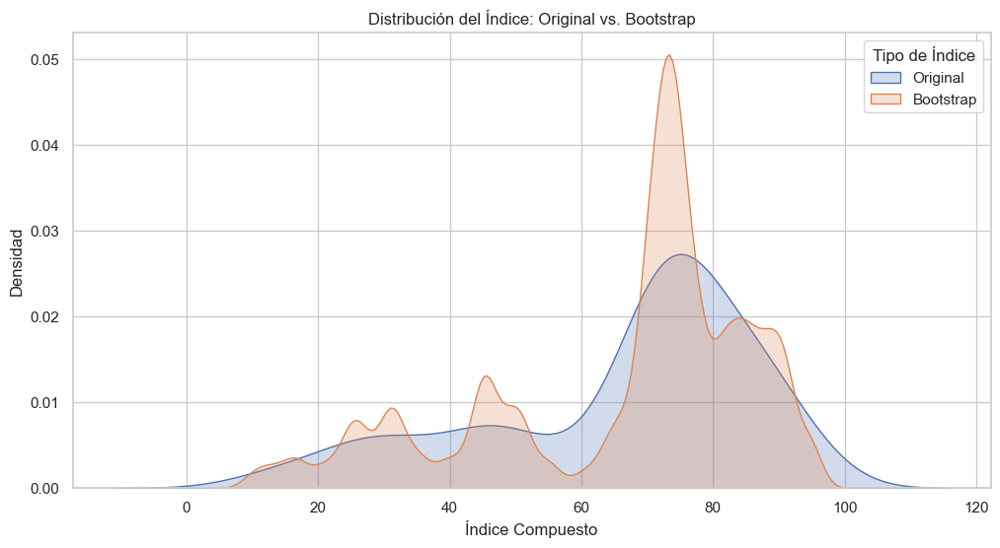

In [83]:
print('Figura 02.45')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['inclusive_society', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='inclusive_society', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

### **Advanced education**

In [84]:
# advanced_education

data = {
    'nuts_code': df['nuts_code'],
}


for var in advanced_education:
    data[var] = df[var]


X = pd.DataFrame(data)

X.set_index('nuts_code', inplace=True)


**[Figura 02.46]**

In [85]:
print('Figura 02.46')
print()

# Aplicar PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Crear un DataFrame con las cargas de PCA
loadings_df = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X.shape[1])], index=X.columns)

# Calcular las cargas absolutas
loadings_abs_df = loadings_df.abs()

# Ordenar las cargas absolutas de mayor a menor para cada componente principal
sorted_loadings_df = loadings_abs_df.apply(lambda x: x.sort_values(ascending=False), axis=0)

print("Listado de indicadores y sus cargas absolutas:")
print(sorted_loadings_df.to_markdown())

# Definir el umbral para las cargas absolutas
threshold = 0.4

# Identificar indicadores que no muestran una alta carga en el primer componente principal
non_consistent_indicators_pc1 = loadings_df[loadings_abs_df['PC1'] < threshold]

print("\nIndicadores no consistentes en PC1:")
print(non_consistent_indicators_pc1.index.tolist())


Figura 02.46

Listado de indicadores y sus cargas absolutas:
|                    |      PC1 |       PC2 |      PC3 |
|:-------------------|---------:|----------:|---------:|
| academic_citations | 0.426392 | 0.0406541 | 0.903624 |
| lifelong_learning  | 0.611907 | 0.748676  | 0.255057 |
| tertiary_education | 0.666152 | 0.661689  | 0.344106 |

Indicadores no consistentes en PC1:
[]


In [86]:
X.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

**[Figura 02.47]**

Figura 02.47


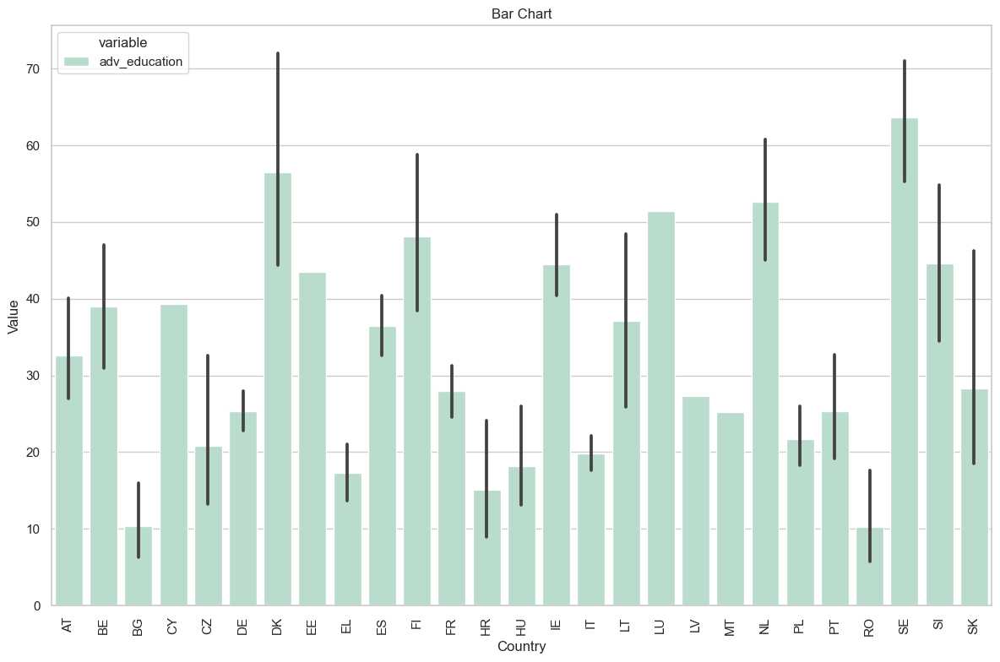

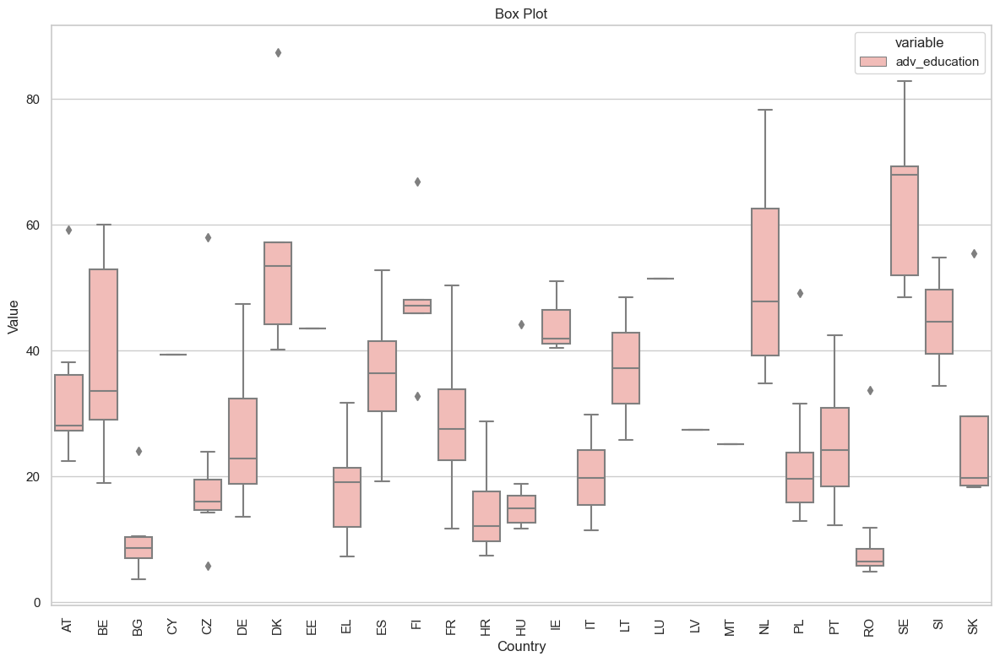

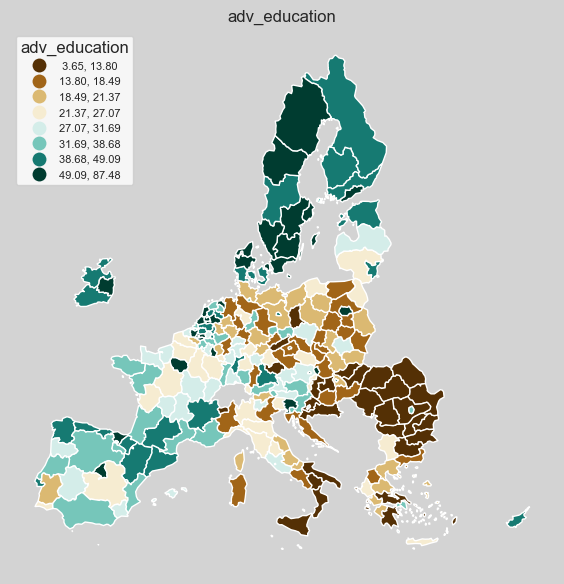

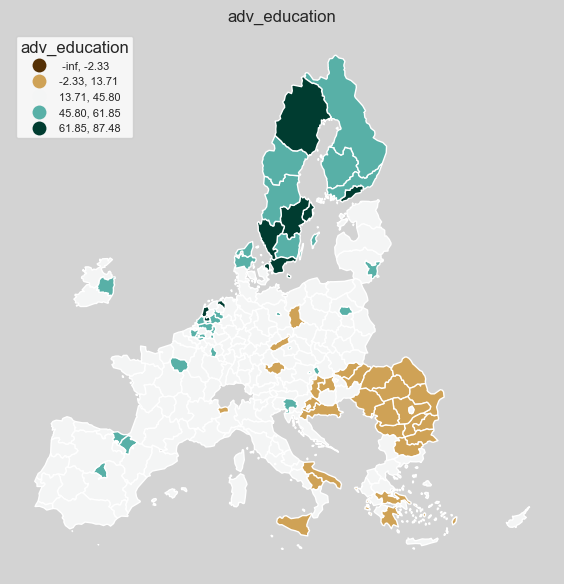

In [87]:
# Agregación
beta = 1

X['adv_education'] = X.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Añadir a componentes

subset = X['adv_education']
componentes_gdf = pd.merge(componentes_gdf, subset, on='nuts_code')


# Graficos y mapas
print('Figura 02.47')
variables = ['adv_education']
plot_bar_chart(componentes_gdf, variables, palette="Pastel2")
plot_box_chart(componentes_gdf, variables, palette="Pastel1")
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='quantiles')
plot_maps(componentes_gdf, variables, exclude_regions=overseas, scheme='stdmean')

* **Analisis de sensibilidad**

**[Figura 02.48]** *Análisis de distintos betas*

Figura 02.48


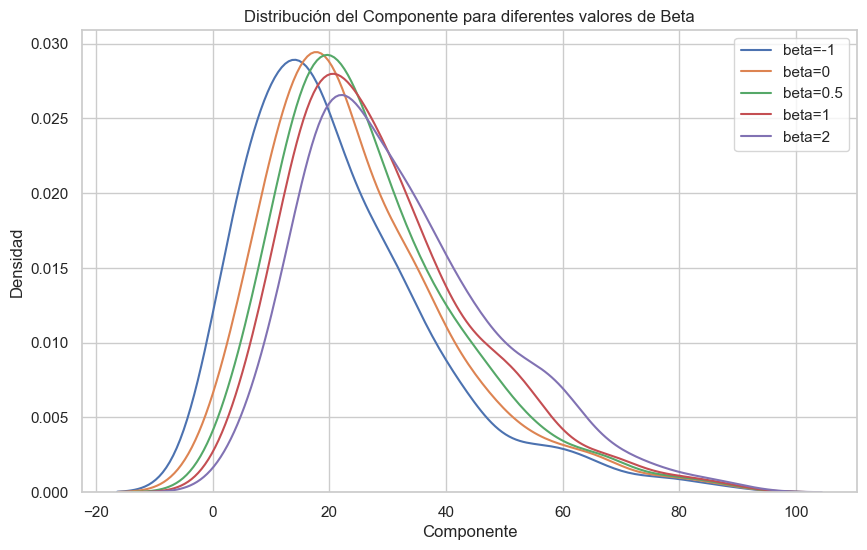

In [88]:
print('Figura 02.48')

data = {
    'nuts_code': df['nuts_code'],
}


for var in advanced_education:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

X_test.drop(columns=non_consistent_indicators_pc1.index.tolist(),inplace=True)

# Valores de beta a probar
beta_values = [-1, 0, 0.5, 1, 2]

# Almacenar los resultados
sensitivity_results = pd.DataFrame(index=X_test.index)

for beta in beta_values:
    sensitivity_results[f'adv_education{beta}'] = X_test.apply(lambda row: generalized_mean(row.values, beta), axis=1)

# Graficar los resultados de sensibilidad para diferentes valores de beta =====================================================

plt.figure(figsize=(10, 6))
for beta in beta_values:
    sns.kdeplot(sensitivity_results[f'adv_education{beta}'], label=f'beta={beta}', fill=False)

plt.title('Distribución del Componente para diferentes valores de Beta')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend()
plt.show()

**[Figura 02.49]** *Añadir/Eliminar indicadores*

Figura 02.49


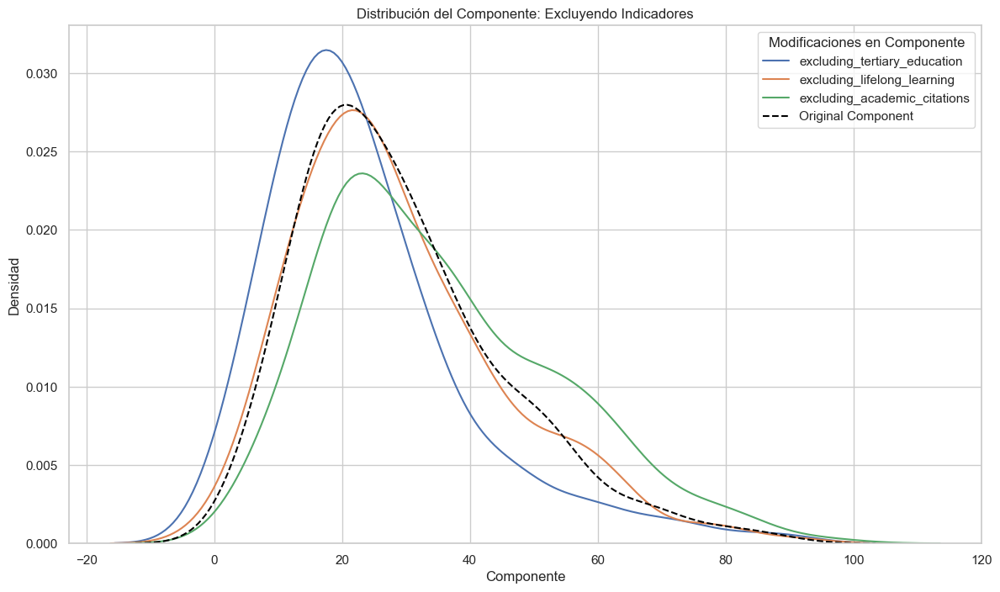

In [89]:
print('Figura 02.49')

data = {
    'nuts_code': df['nuts_code'],
}


for var in advanced_education:
    data[var] = df[var]


X_test = pd.DataFrame(data)

X_test.set_index('nuts_code', inplace=True)

# DataFrame para almacenar los resultados de sensibilidad
sensitivity_results_test = pd.DataFrame(index=X_test.index)

# Analizar el impacto de quitar cada indicador (usando X_test)
for indicator in advanced_education:
    temp_X = X_test.drop(columns=[indicator])
    sensitivity_results_test[f'excluding_{indicator}'] = temp_X.apply(lambda row: generalized_mean(row.values, 1), axis=1)
    


# Graficar las distribuciones de los índices al excluir indicadores ===========================================================

plt.figure(figsize=(14, 8))

# Gráfica de exclusión de indicadores
for col in sensitivity_results_test.columns:
    sns.kdeplot(sensitivity_results_test[col], label=col)

# Gráfico del índice original
sns.kdeplot(X['adv_education'], label='Original Component', color='black', linestyle='--')

plt.title('Distribución del Componente: Excluyendo Indicadores')
plt.xlabel('Componente')
plt.ylabel('Densidad')
plt.legend(loc='best', title='Modificaciones en Componente')
plt.show()

**[Figura 02.50]** *Bootstraping*

Figura 02.50

Bootstrap:
+---+-------------------+--------------------------+---------------------------+---------------------------+
|   |     Variance      | Confidence Interval Mean | Confidence Interval Lower | Confidence Interval Upper |
+---+-------------------+--------------------------+---------------------------+---------------------------+
| 0 | 254.3729383127783 |    29.324082086037595    |     29.26053672643881     |     29.38762744563638     |
+---+-------------------+--------------------------+---------------------------+---------------------------+

Datos originales:
Varianzas:
255.4480180701051

Intervalo de Confianza al 95%:
(29.32911236484893, 27.315389704869524, 31.342835024828332)



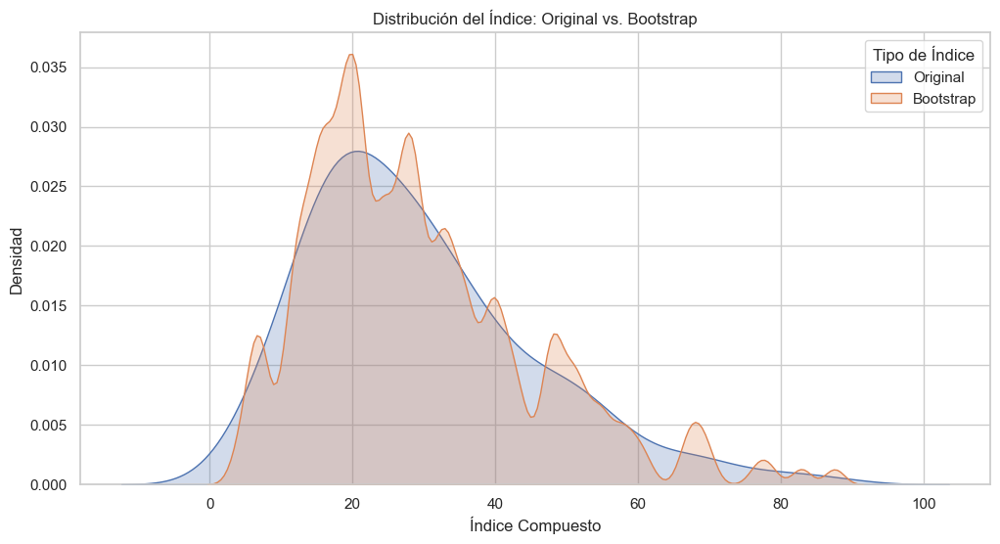

In [90]:
print('Figura 02.50')
print()

n_bootstrap=1000
beta = 1

# Realizar análisis bootstrap
bootstrap_df, results = bootstrap_analysis(X, beta, n_bootstrap=n_bootstrap)

print("Bootstrap:")
print(tabulate(results, headers='keys', tablefmt='pretty'))

print()

print('Datos originales:')
# Datos originales

varianza = subset.var()

intervalo_confianza = calcular_intervalo_confianza(subset)

print("Varianzas:")
print(varianza)
print("\nIntervalo de Confianza al 95%:")
print(intervalo_confianza)

print()

# Distribución

X['Indice']='Original'
bootstrap_df['Indice']='Bootstrap'

X_combined = X[['adv_education', 'Indice']].copy()
bootstrap_combined = bootstrap_df[['Bootstrap Index', 'Indice']].copy()

# Combinar ambos DataFrames
combined_df = pd.concat([X_combined, bootstrap_combined], axis=0)

# Crear la gráfica
plt.figure(figsize=(12, 6))

# Gráfico de densidad para los índices originales y bootstrap
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Original'], x='adv_education', label='Original', fill=True, common_norm=False)
sns.kdeplot(data=combined_df[combined_df['Indice'] == 'Bootstrap'], x='Bootstrap Index', label='Bootstrap', fill=True, common_norm=False)

# Configurar título y etiquetas
plt.title('Distribución del Índice: Original vs. Bootstrap')
plt.xlabel('Índice Compuesto')
plt.ylabel('Densidad')

# Mostrar leyenda
plt.legend(title='Tipo de Índice')

# Mostrar la gráfica
plt.show()

## Analisis Componentes

In [91]:
componentes_df = componentes_gdf.drop(columns='geometry')

In [92]:
# Seleccionar solo las columnas numéricas
num_cols = componentes_df.select_dtypes(include=['float64', 'int64'])

# Redondear las columnas numéricas a 2 decimales
componentes_df[num_cols.columns] = num_cols.round(2)

**[Figura 02.51]**

In [93]:
componentes_df.describe()

,nutrition_medical_care,water_sanitation,safety,basic_education,info_comm,health,env_quality,trust_gov,freedom_choice,inclusive_society,adv_education
count,242.000000,242.000000,242.000000,242.000000,242.000000,242.00000,242.000000,242.000000,242.000000,242.000000,242.000000
mean,66.869463,84.304835,59.554504,65.777107,59.619669,70.57814,69.976736,54.657479,57.266405,66.181322,29.328719
std,14.948206,23.338232,19.285753,19.759232,18.191665,16.70554,16.511378,16.718278,9.914459,20.807258,15.982716
min,0.000000,0.000000,1.150000,3.630000,10.000000,20.05000,14.140000,18.430000,27.800000,9.840000,3.650000
25%,61.860000,79.332500,48.875000,60.900000,50.750000,66.03500,64.417500,41.117500,51.160000,51.242500,18.062500
50%,69.070000,95.710000,63.595000,72.120000,59.940000,76.71000,74.615000,59.290000,57.360000,73.150000,26.580000
75%,76.290000,99.457500,73.870000,76.770000,70.670000,81.19250,80.952500,66.230000,64.347500,80.850000,38.075000
max,100.000000,100.000000,91.500000,100.000000,96.410000,93.98000,99.340000,92.110000,80.330000,95.020000,87.480000


In [94]:
variables = [
    'nutrition_medical_care',
    'water_sanitation',
    'safety',
    'basic_education',
    'info_comm',
    'health',
    'env_quality',
    'trust_gov',
    'freedom_choice',
    'inclusive_society',
    'adv_education'
]

**[Figura 02.52]**

Figura 02.52


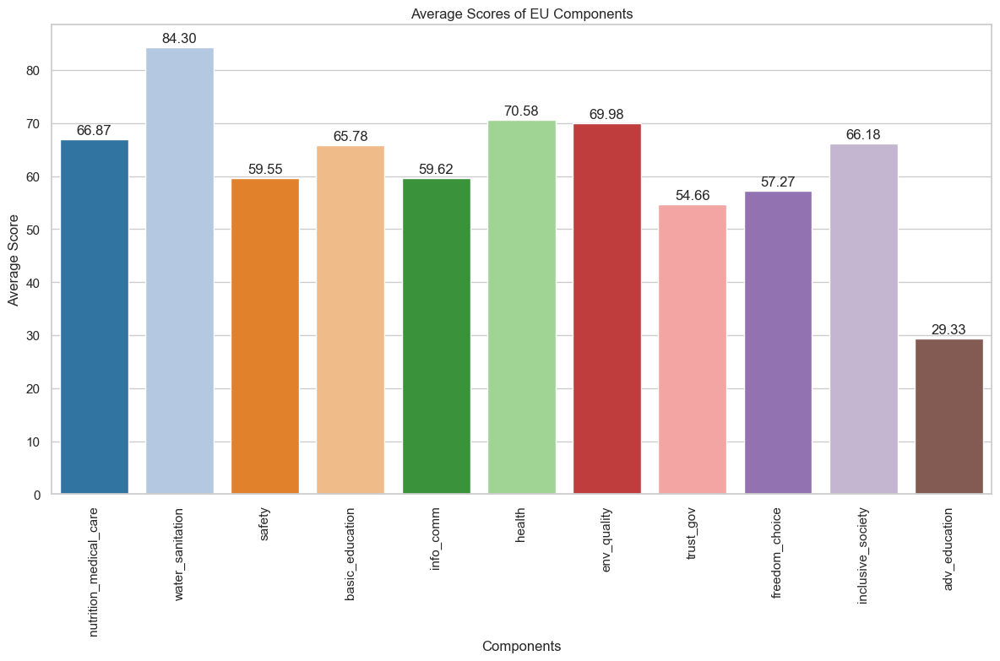

In [95]:
print('Figura 02.52')

# Promedio de cada componente
averages = {var: componentes_df[var].mean() for var in variables}

df_avg = pd.DataFrame(list(averages.items()), columns=['Component', 'Average'])

# Grafico
plt.figure(figsize=(12, 8))

ax = sns.barplot(x='Component', y='Average', data=df_avg, palette='tab20')

plt.xlabel('Components')
plt.ylabel('Average Score')
plt.title('Average Scores of EU Components')
plt.xticks(rotation=90)

# Etiquetas
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 0.5, f'{height:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()


**[Figura 02.53]**

Figura 02.53


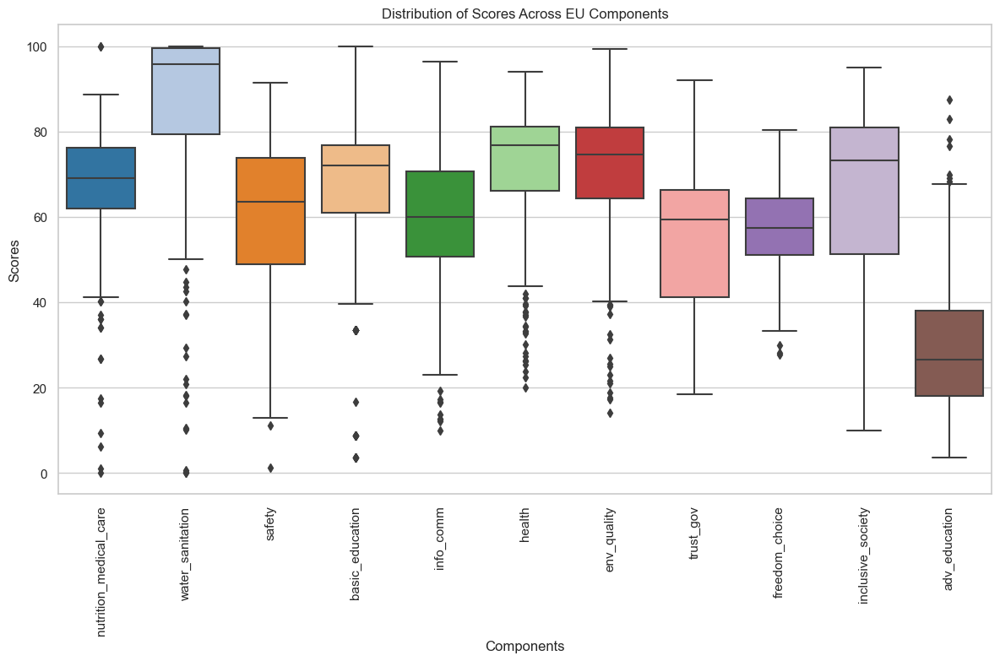

In [96]:
print('Figura 02.53')

# Boxplot

df_boxplot = componentes_df[variables]

# Crear el gráfico
plt.figure(figsize=(12, 8))

ax = sns.boxplot(data=df_boxplot, palette='tab20')

plt.xlabel('Components')
plt.ylabel('Scores')
plt.title('Distribution of Scores Across EU Components')
plt.xticks(rotation=90)

plt.tight_layout()
 
plt.show()

 
 

**[Figura 02.54]**

Figura 02.54


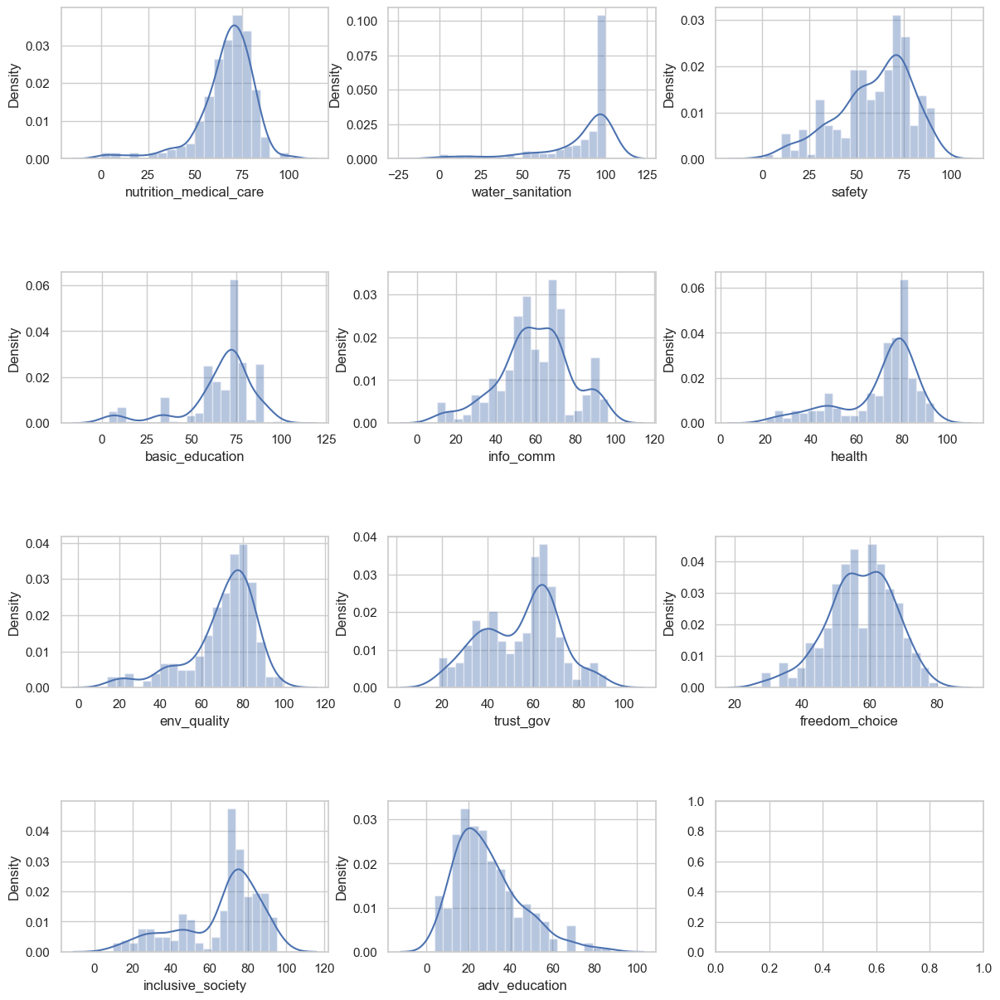

In [97]:
print('Figura 02.54')

num_cols = componentes_df.select_dtypes(include=['number']).columns

fig, axs = plt.subplots(ncols=3, nrows=4, figsize=(12, 12))
axs = axs.flatten()

index = 0
for col in componentes_df[num_cols]:
    sns.distplot(componentes_df[col], bins=20, ax=axs[index])
    index += 1

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

**[Figura 02.55]**

Figura 02.55


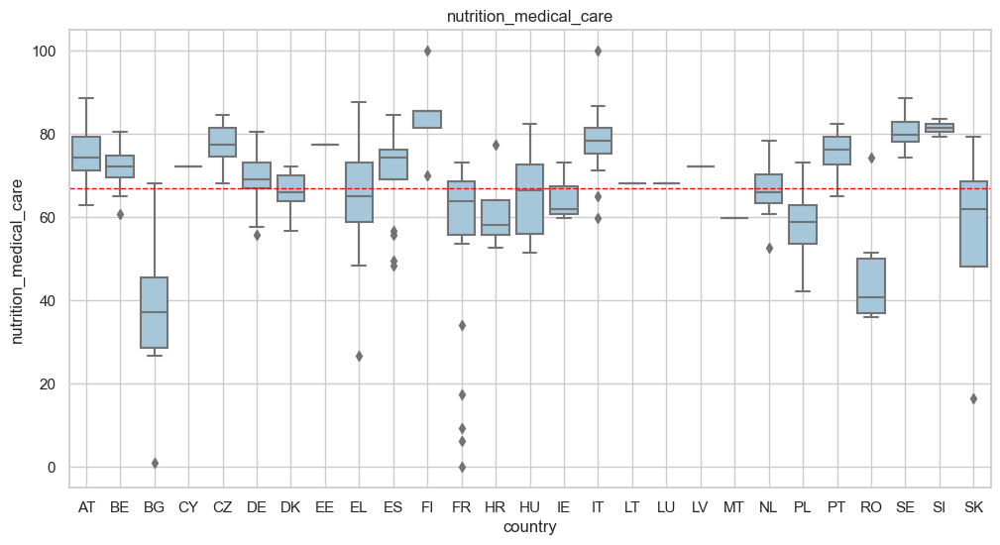

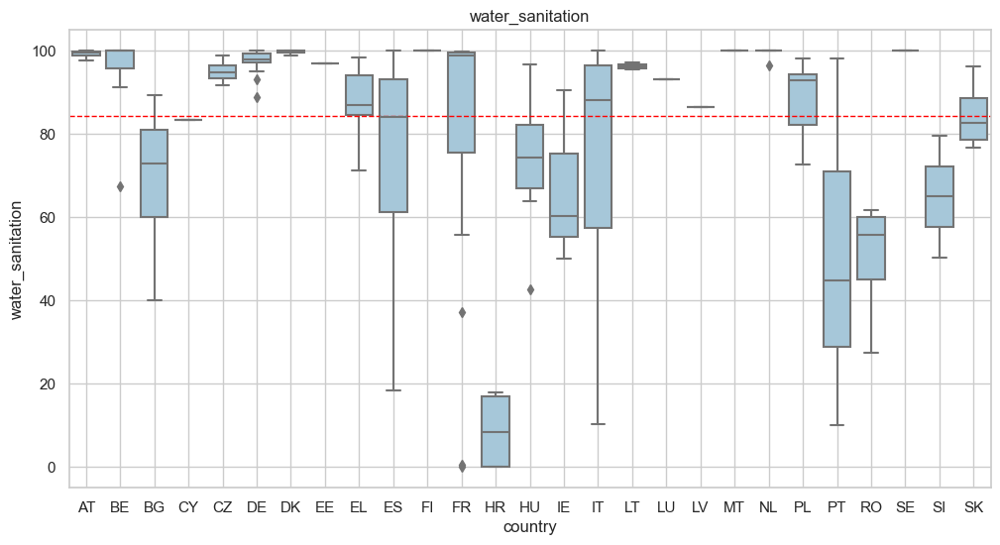

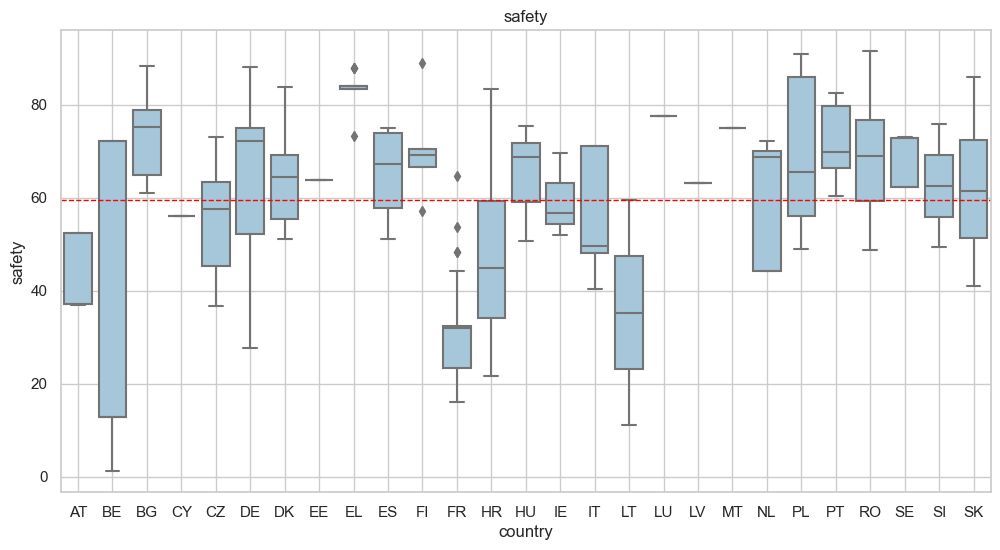

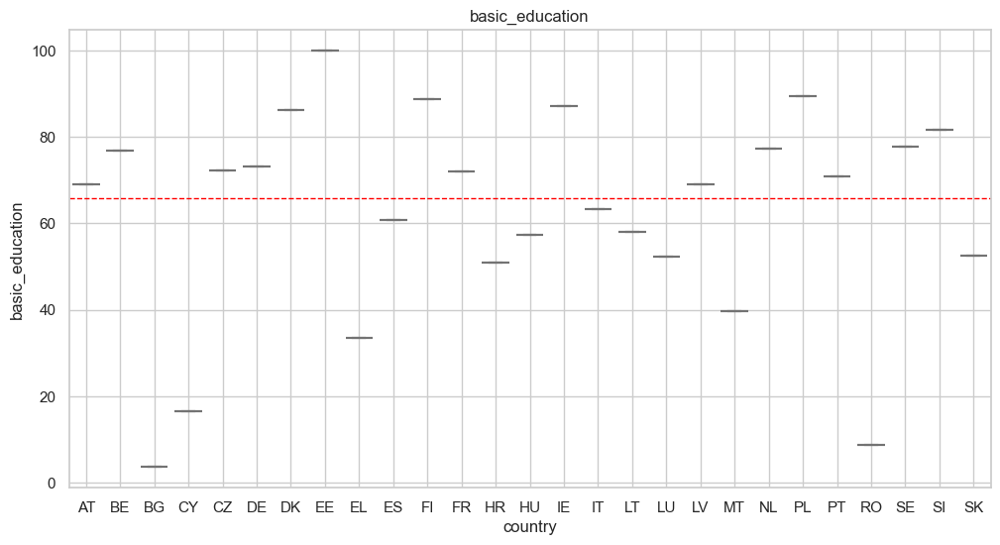

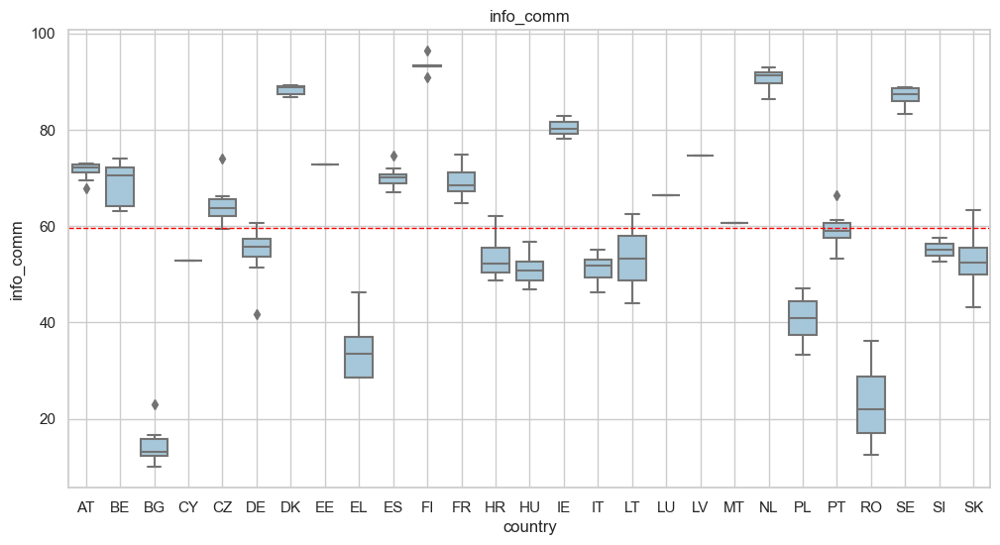

...

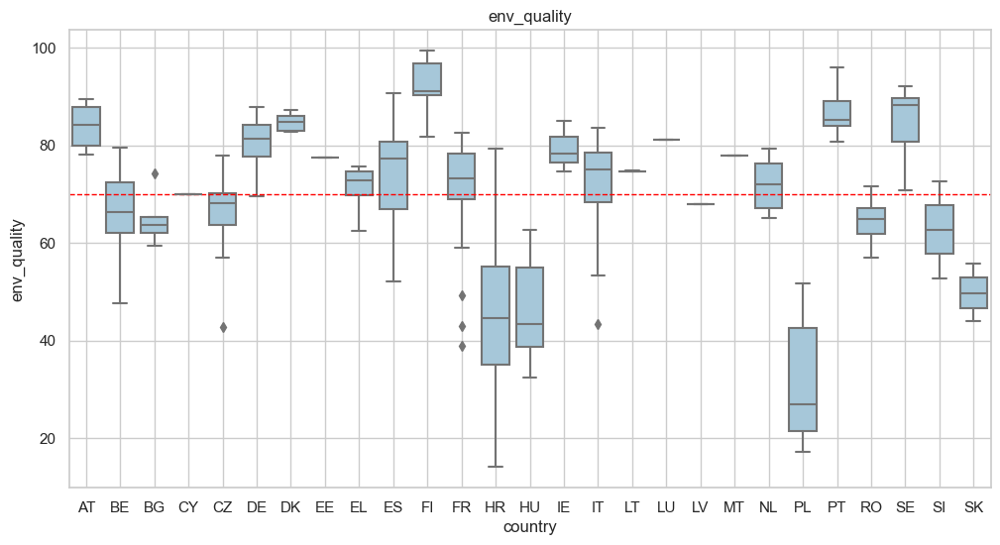

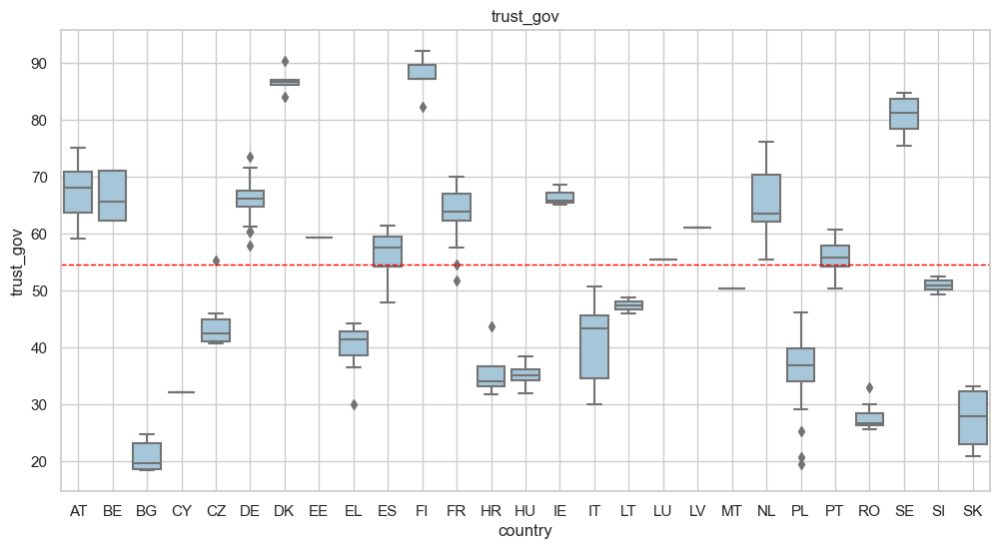

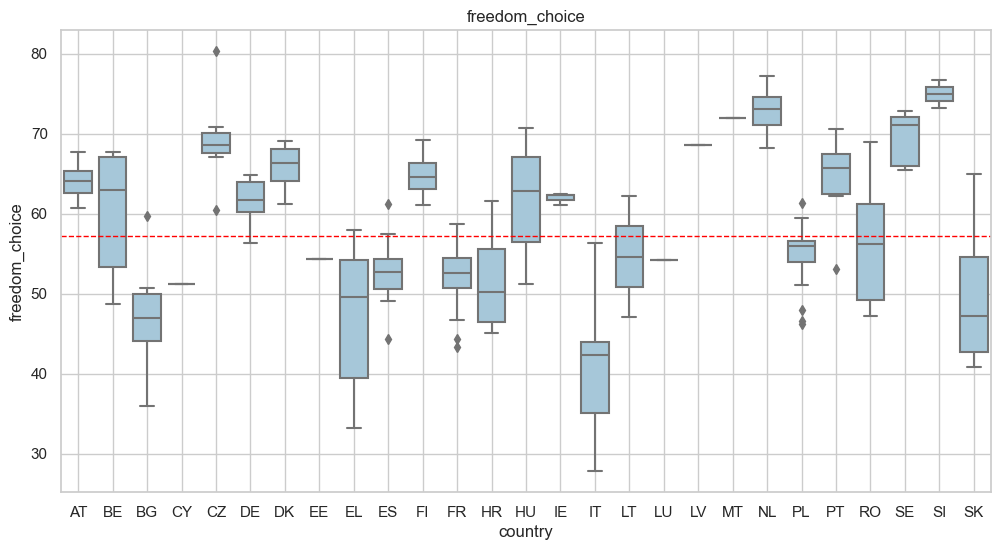

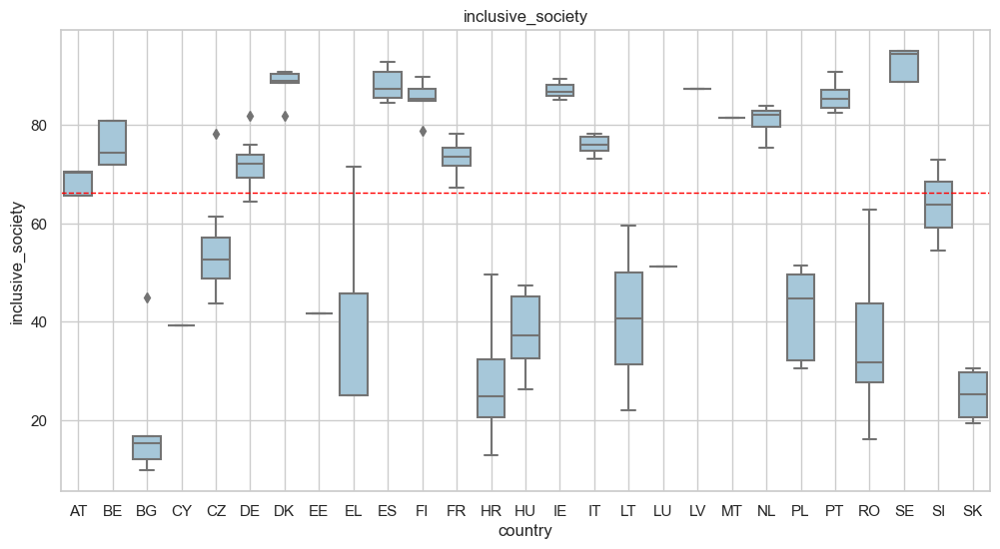

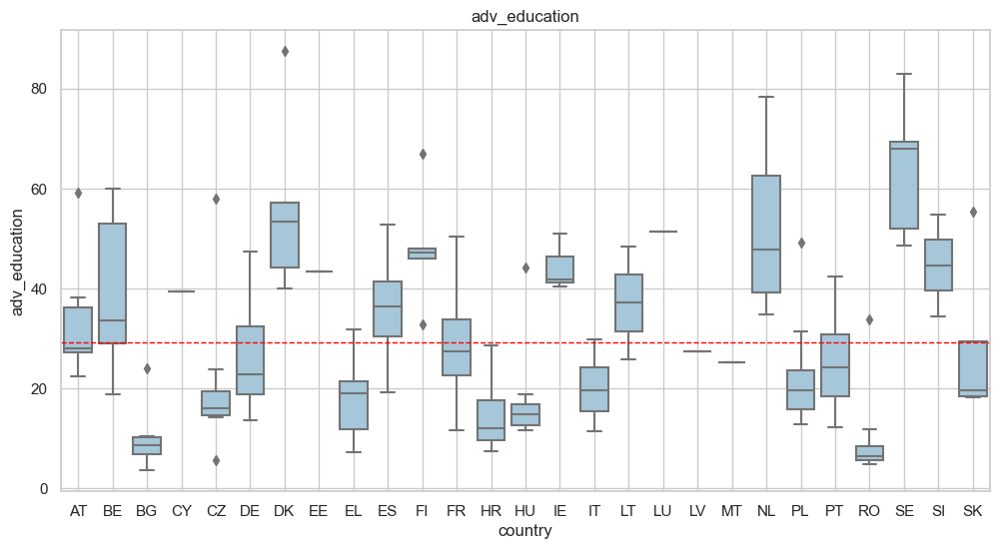

In [98]:
print('Figura 02.55')

num_cols= componentes_df.select_dtypes(include=['float64', 'int64'])

country_col = 'country'

for col in num_cols:
    plt.figure(figsize=(12, 6))

    sns.boxplot(x='country', y=col, data=componentes_df, color='#9ecae1')

    mean = componentes_df[col].mean()
    plt.axhline(mean, color='red', linestyle='--', linewidth=1, label=f'Media ({mean:.2f})')

    plt.title(col)

    plt.grid(True)

    plt.show()

**[Figura 02.56]**

Figura 02.56


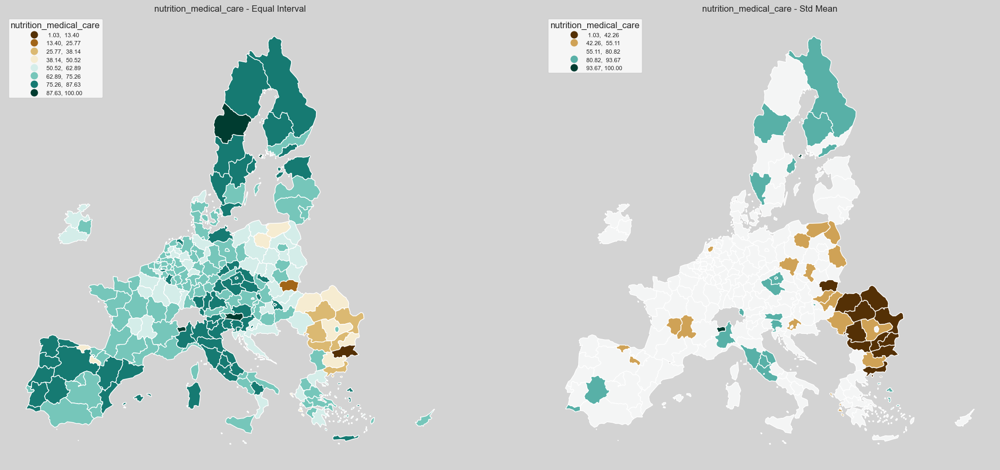

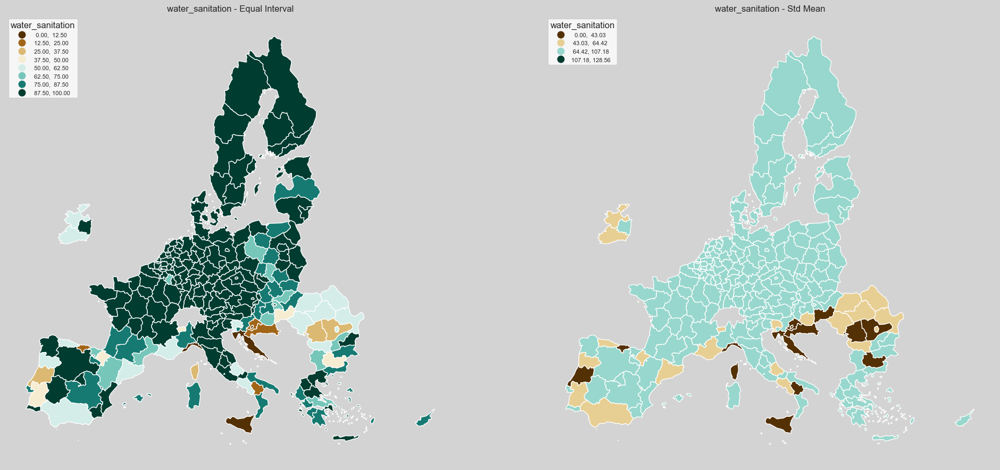

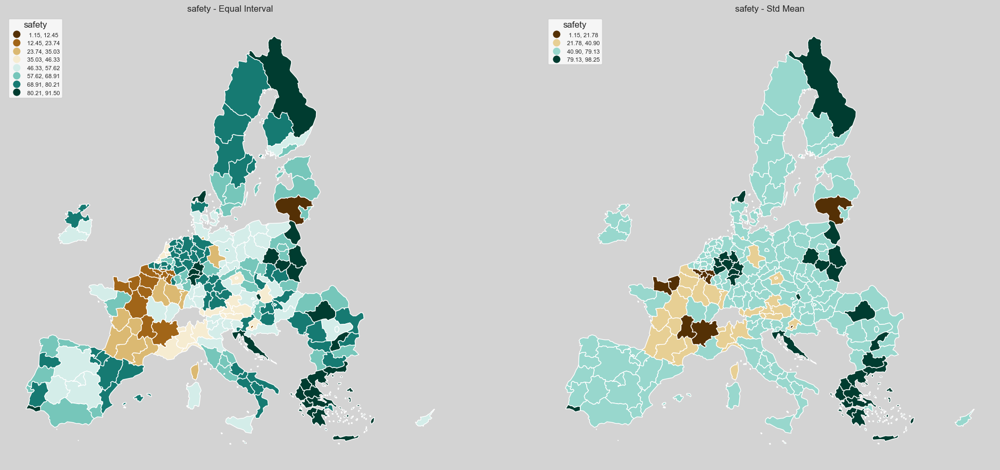

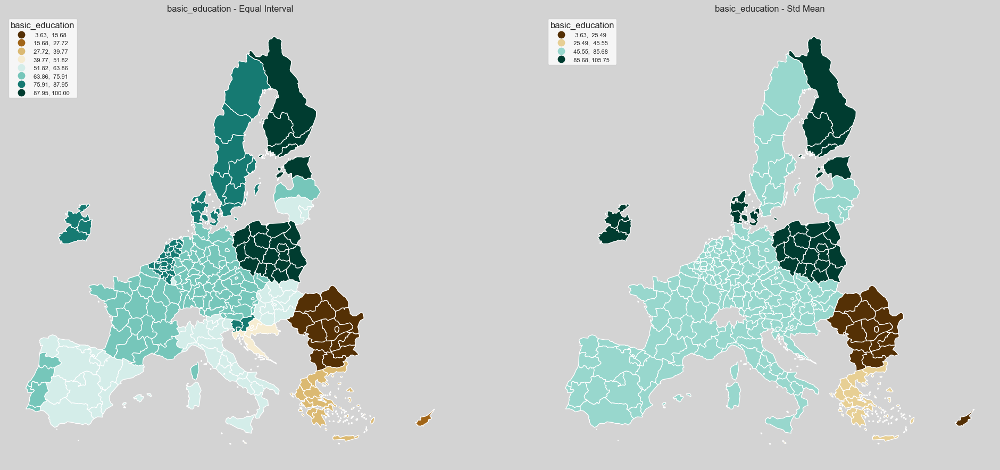

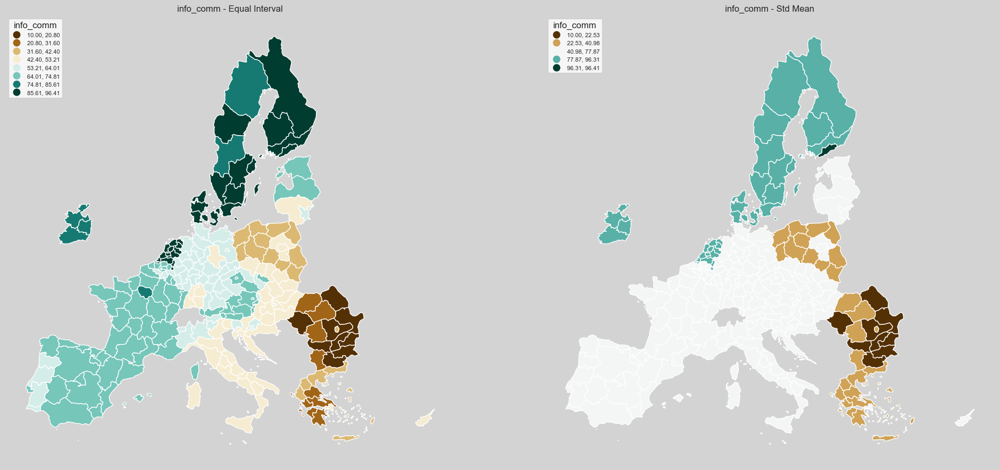

...

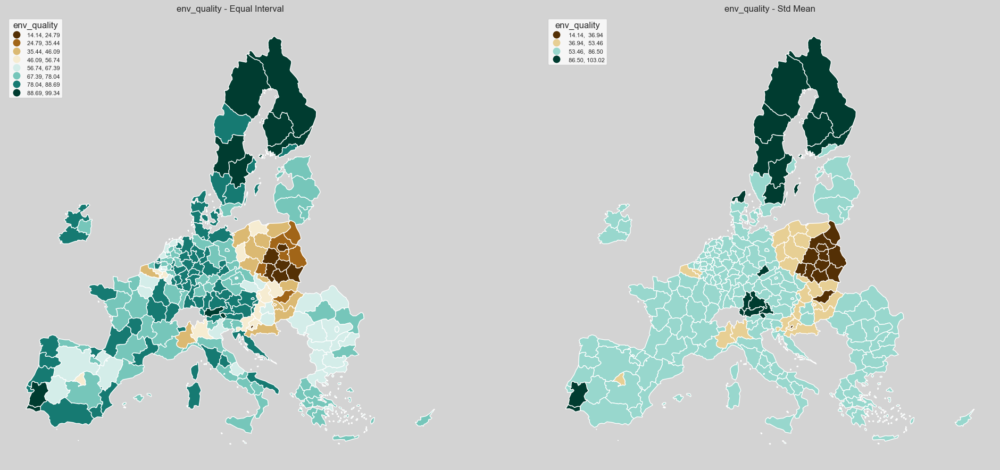

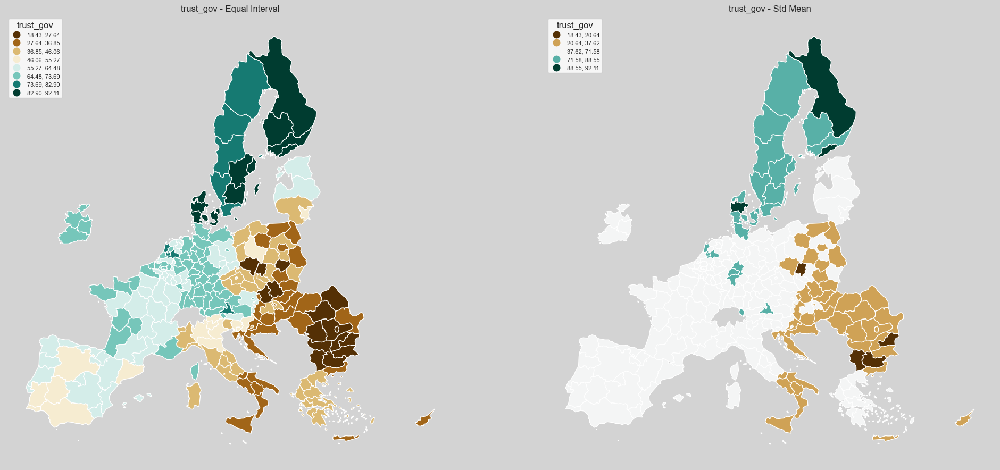

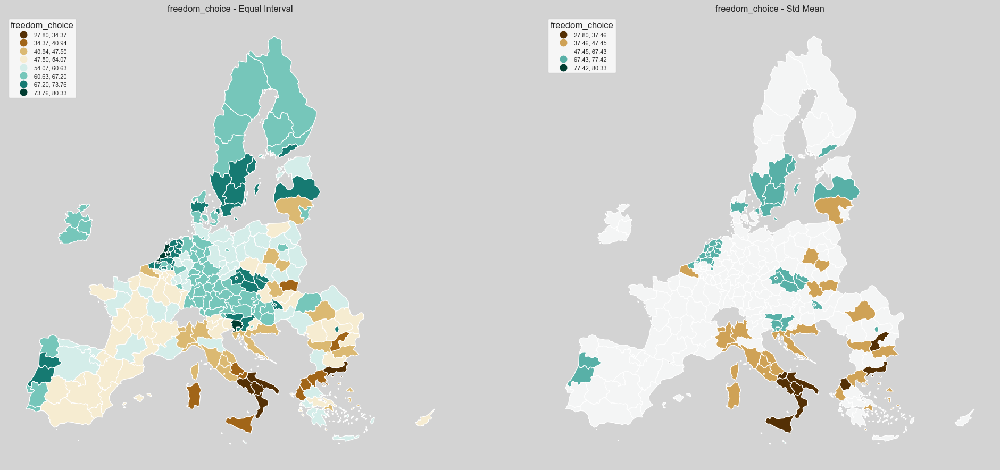

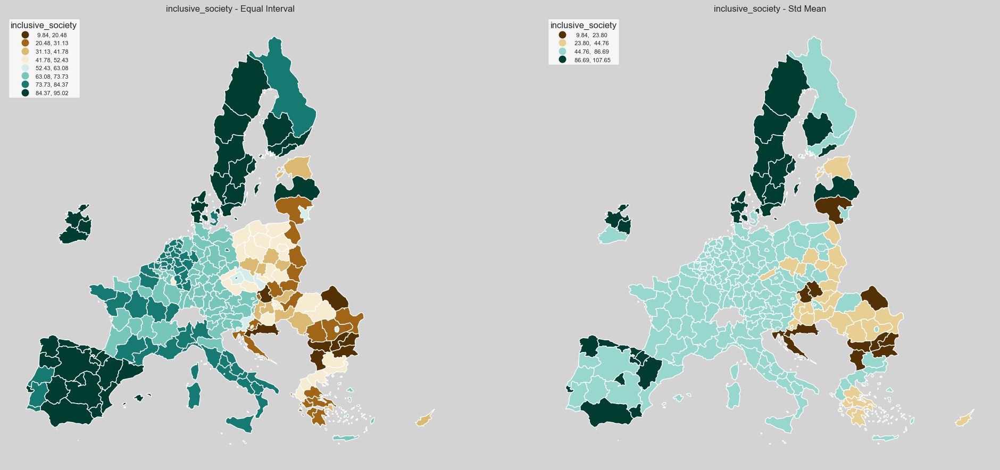

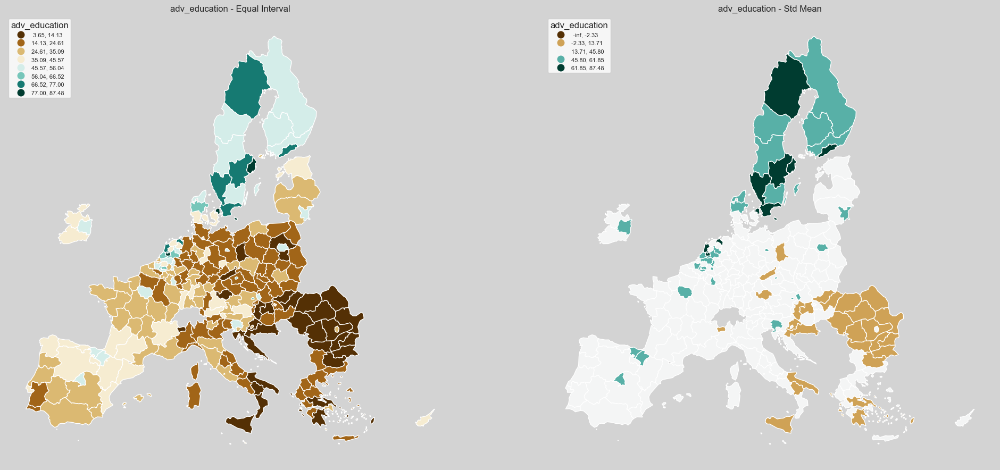

In [99]:
print('Figura 02.56')

# Mapas

filtered = componentes_gdf[~componentes_gdf['region'].isin(overseas)]

num_cols = filtered.select_dtypes(include=np.number).columns


for column in num_cols:
    fig, axes = plt.subplots(1, 2, figsize=(24, 12))  # Crear dos subgráficos pareados

    fig.patch.set_facecolor('lightgrey')

    # Primer gráfico usando scheme='equal_interval'
    filtered.plot(column=column,
                  scheme='equal_interval',
                  k=8,
                  cmap='BrBG',
                  edgecolor='w',
                  legend=True,
                  ax=axes[0],
                  legend_kwds={'loc': 'upper left', 'fontsize':'8', 'title': column}
    )
    axes[0].set_title(f'{column} - Equal Interval')
    axes[0].set_axis_off()

    # Segundo gráfico usando scheme='std_mean'
    filtered.plot(column=column,
                  scheme='std_mean',
                  cmap='BrBG',
                  edgecolor='w',
                  legend=True,
                  ax=axes[1],
                  legend_kwds={'loc': 'upper left', 'fontsize':'8', 'title': column}
    )
    axes[1].set_title(f'{column} - Std Mean')
    axes[1].set_axis_off()

    plt.show()

## **GDP**

In [100]:
componentes_df=pd.merge(componentes_df, df[['nuts_code','gdp_per_capita_2022']], how='left', on='nuts_code')


**[Figura 02.57]**

Figura 02.57


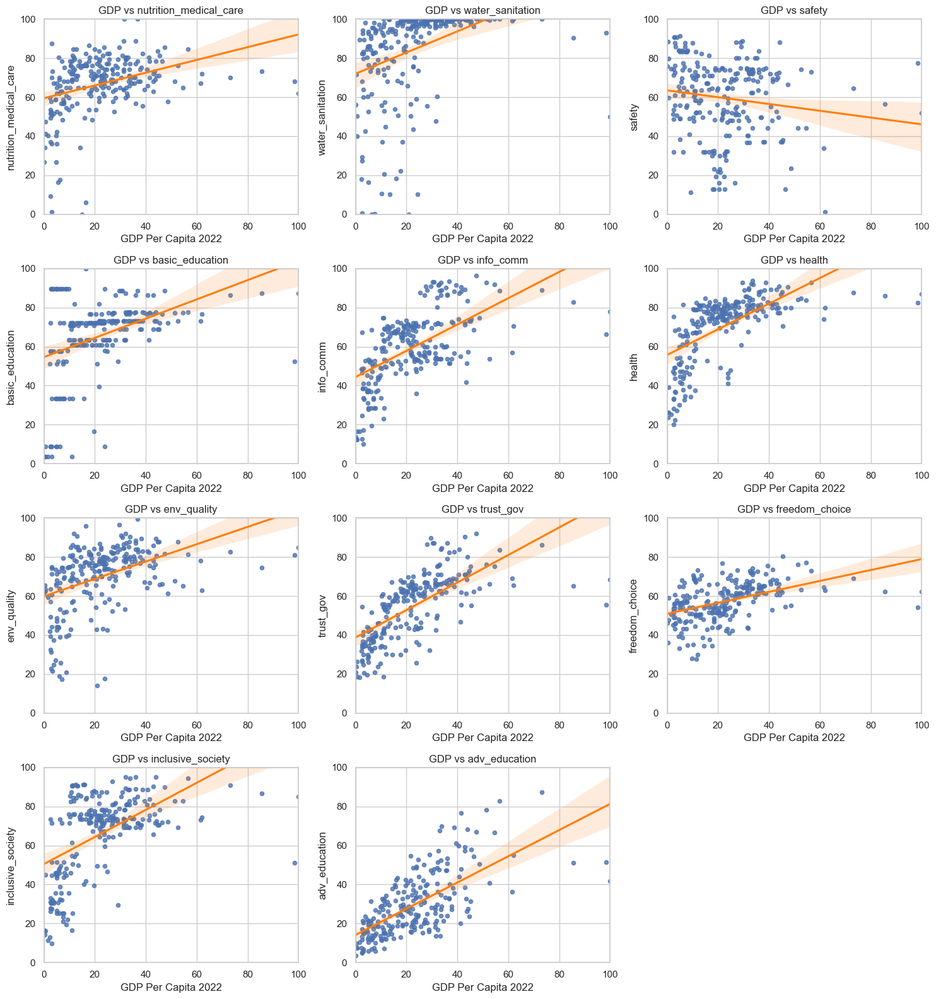

In [101]:
print('Figura 02.57')

# Número de filas y columnas en el grid
n_vars = len(variables)
n_cols = 3  # Puedes ajustar esto según el número de variables
n_rows = (n_vars + n_cols - 1) // n_cols  # Calcula el número de filas necesarias

# Crear el grid de gráficos de dispersión con línea de regresión
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))

# Flatten the axes array for easy iteration
axes = axes.flatten()

for ax, var in zip(axes, variables):
    sns.regplot(x='gdp_per_capita_2022', y=var, data=componentes_df, ax=ax, scatter_kws={'s':20}, line_kws={'color':'#ff7f0e'})
    ax.set_title(f'GDP vs {var}')
    ax.set_xlabel('GDP Per Capita 2022')
    ax.set_ylabel(var)
    ax.set_xlim(0, 100)  # Limitar el eje x a [0, 100]
    ax.set_ylim(0, 100)  # Limitar el eje y a [0, 100]

# Eliminar ejes vacíos si hay menos gráficos que subgrillas
for ax in axes[len(variables):]:
    ax.remove()

plt.tight_layout()
plt.show()

**[Figura 02.58]**

In [102]:
from scipy.stats import pearsonr
from pandas.plotting import table

results = {
    'Variable': [],
    'Correlación': [],
    'p-Valor': [],
    'Significancia': []
}

# Calcular correlaciones y p-valores
for var in variables:
    try:
        corr, p_value = pearsonr(componentes_df['gdp_per_capita_2022'], componentes_df[var])

        # Determinar significancia
        if p_value < 0.05:
            significancia = 'Significativo'
        else:
            significancia = 'No Significativo'

        # Evaluar dirección de la correlación
        if corr > 0:
            direccion = 'Positiva'
        elif corr < 0:
            direccion = 'Negativa'
        else:
            direccion = 'Nula'

        # Agregar resultados a las listas
        results['Variable'].append(var)
        results['Correlación'].append(corr)
        results['p-Valor'].append(p_value)
        results['Significancia'].append(f'{significancia}, {direccion}')
    except KeyError as e:
        print(f"Error con la variable {var}: {e}")

results_df = pd.DataFrame(results)

print('Figura 02.58')
print()
print('GDP Per Capita 2022')
print(tabulate(results_df, headers='keys', tablefmt='fancy_grid', floatfmt=(".3f", ".3f", ".3f")))



Figura 02.58

GDP Per Capita 2022
╒════╤════════════════════════╤═══════════════╤═════════════╤═════════════════════════╕
│    │ Variable               │   Correlación │     p-Valor │ Significancia           │
╞════╪════════════════════════╪═══════════════╪═════════════╪═════════════════════════╡
│  0 │ nutrition_medical_care │         0.349 │ 2.37058e-08 │ Significativo, Positiva │
├────┼────────────────────────┼───────────────┼─────────────┼─────────────────────────┤
│  1 │ water_sanitation       │         0.372 │ 2.40256e-09 │ Significativo, Positiva │
├────┼────────────────────────┼───────────────┼─────────────┼─────────────────────────┤
│  2 │ safety                 │        -0.144 │ 0.0249993   │ Significativo, Negativa │
├────┼────────────────────────┼───────────────┼─────────────┼─────────────────────────┤
│  3 │ basic_education        │         0.398 │ 1.24971e-10 │ Significativo, Positiva │
├────┼────────────────────────┼───────────────┼─────────────┼─────────────────────────

## Guardar dataset Componentes

In [103]:
componentes_df.to_csv('02_componentes_minmax.csv',
                     index = False)